In [1]:
"""
File: compare_tng_to_spam.py
Author: Matthew Ogden
Email: ogdenm12@gmail.com
Github: mbogden
Created: 2024-Nov-12

Description: During the TNG to SPAM unit conversion process, I discovered
    that the default SPAM hyperparameters were not optimal.   But in order to 
    fine-tune them, I needed a metric to quantify the similarity between TNG and SPAM.
    Thus, this module creates a few methods for comparing the two simulations.

References: 
- Sections of this code were written with the assistance of ChatGPT made by OpenAI.
- TNG50 Simulation Data
    - Nelson, D. et al. (2015). The Illustris Simulation: Public Data Release. Astronomy and Computing, 13, 12–37. https://doi.org/10.1016/j.ascom.2015.09.003
    - Nelson, D. et al. (2019). First results from the TNG50 simulation: Galactic outflows driven by supernovae and black hole feedback. Monthly Notices of the Royal Astronomical Society, 490(3), 3234–3261. https://doi.org/10.1093/mnras/stz2306
    - Pillepich, A. et al. (2019). First results from the TNG50 simulation: The evolution of stellar and gaseous discs across cosmic time. Monthly Notices of the Royal Astronomical Society, 490(3), 3196–3233. https://doi.org/10.1093/mnras/stz2338

"""
# ================================ IMPORTS ================================ #
import hashlib, os, sys, logging, time
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from mpi4py import MPI
from copy import deepcopy
import glob

# Add main project directory to import project modules
try:
    SCRIPT_DIRECTORY = os.path.dirname(os.path.realpath(__file__))
    PROJECT_DIRECTORY = os.path.dirname(SCRIPT_DIRECTORY)
    sys.path.append(PROJECT_DIRECTORY)

except:
    # Assume we are running from the script directory
    SCRIPT_DIRECTORY = os.getcwd()
    PROJECT_DIRECTORY = os.path.dirname(SCRIPT_DIRECTORY)
    
    # Also assume you might be in galStuff directory
    work_dir = os.getcwd()
    if 'galStuff' == work_dir.split('/')[-1]:
        PROJECT_DIRECTORY =  work_dir + '/galaxyJSPAM'
        sys.path.append(PROJECT_DIRECTORY)

# Import project modules
import IllustrisTNG.tng_functions as tf
import IllustrisTNG.convert_tng_to_spam as cts
import utilities.parallel_queue_manager as qm
# import Optimization_Methods.optimization_manager as om
import Simulator.new_simulator as sim
import utilities.general_utility as gu

# ================================ GLOBALS ================================ #
script_args, logger = gu.initialize_environment( module_name='spam_tuner' )
buildEnv = False  # For testing and development purposes only

# Set NumPy print options to reduce the precision to 3 decimal places
logger.debug("Imports Done")

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-g5sotuwv because the default path (/home/jovyan/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
# Development Cell:  This should only be present in the development Jupyter Notebook version of this script
buildEnv = True

from importlib import reload

# Warn user if NOT in jupyter notebook, require a yes/no response to continue or not
if "ipykernel" not in sys.modules:
    msg = "Development Environment Detected.  Do you want to continue?..."

    # Get user input
    while True:
        response = input(f"{msg} (y/n): ").lower()
        if response in ['y', 'yes']:
            break
        elif response in ['n', 'no']:
            print("Exiting...")
            sys.exit()
        else:
            print("Invalid input. Please enter 'y' or 'n'.")



# TNG Sample Targets
Let's load a few targets and example orbits that we'll want to score.  

In [4]:
if buildEnv and False:

    # Set logger level
    logger.setLevel(logging.INFO)
    
    # Target Unique IDs
    p1 = 62000000190717 
    p2 = 75000000121160 

    
    # Empty items default to SPAM Default
    spam_param = {}
    spam_param['Default'] = {}
    spam_param['Off Time'] = { 'm_halo': 10, 'lnl': 0.05 }
    spam_param['Hand Found'] = { 'm_halo': 5.8, 'lnl': 0.007, 'r_scale': 20 }

    # Let's adjust the SPAM parameters to see if we can get a better match
    overwrite = True
    
    if overwrite or not orbits:
        tng_target_1 = tng_target_1['reset_plot_info']()    
        orbits = {}    

    spam_ar = tng_target_1['generate_spam_array'](5.0)[0]
    for k, v in spam_param.items():
        if orbits.get(k) is None or overwrite:
            print( f"Running: {k}" )
            orbits[k] = {}
            orbits[k]['orbit'] = sim.spam_orbit( spam_ar, current_time=tng_target_1['current_time'], spam_setup_params=v )
            _ = add_spam_orbit_info( orbits[k]['orbit'], tng_target_1, f'SPAM - {k}', True, False )
            orbits[k]['pts'] = sim.basic_run( spam_ar, npts1=10000, npts2=20000, spam_setup_params=v, heat1=0.2, heat2=0.2 )[1]

    # Let's create side by side plots
    fig, axs = plt.subplots(2, 2, figsize=(24, 24))
    
    # Let's plot the new orbit
    xy_histogram( \
        tng_target_1['pts'], \
        tng_target_1['plot_list'], tng_target_1['plot_labels'], \
        show_labels = True, std_dev = 3,
        annotations= tng_target_1['annotations'],
        title = f'Target 1 - {tng_target_1["current_info"]["p_SubhaloIDRaw"]}\nTNG Particles',
        # figsize=(12,12),
        ext_ax = axs[0,0],
    )

    # Loop through other three plots
    for i, (k, v) in enumerate(orbits.items()):
        xy_histogram( \
            v['pts'], \
            tng_target_1['plot_list'], tng_target_1['plot_labels'], \
            show_labels = True, std_dev = 2,
            annotations= tng_target_1['annotations'],
            title = f'Target 1 - {tng_target_1["current_info"]["p_SubhaloIDRaw"]}\nSPAM Particles - {k}',
            bins=200,
            ext_ax = axs[(i+1)//2,(i+1)%2],
        )
        

[2025-03-18 11:08:16,555 - INFO - convert_tng_to_spam.__init__]: Initializing TNG Target Class...


[2025-03-18 11:08:19,444 - INFO - new_simulator.set_spam_parameters]: Setting SPAM Parameters: 
[2025-03-18 11:08:19,455 - INFO - new_simulator.get_spam_parameters]: Querying SPAM Parameters
[2025-03-18 11:08:19,457 - INFO - new_simulator.spam_orbit]: Running SPAM Simulation - Orbit Run
[2025-03-18 11:08:19,457 - INFO - new_simulator.set_spam_parameters]: Setting SPAM Parameters: 


Target pts: True
Orbit Save Loc: (True) - /home/mbo2d/data/misc_spam_orbits


[2025-03-18 11:08:42,539 - INFO - new_simulator.set_spam_parameters]: Setting SPAM Parameters: 
[2025-03-18 11:08:42,551 - INFO - new_simulator.get_spam_parameters]: Querying SPAM Parameters
[2025-03-18 11:08:42,553 - INFO - new_simulator.spam_orbit]: Running SPAM Simulation - Orbit Run
[2025-03-18 11:08:42,554 - INFO - new_simulator.set_spam_parameters]: Setting SPAM Parameters: 
[2025-03-18 11:08:46,143 - INFO - new_simulator.set_spam_parameters]: Setting SPAM Parameters: 
[2025-03-18 11:08:46,159 - INFO - new_simulator.get_spam_parameters]: Querying SPAM Parameters
[2025-03-18 11:08:46,160 - INFO - new_simulator.spam_orbit]: Running SPAM Simulation - Orbit Run
[2025-03-18 11:08:46,162 - INFO - new_simulator.set_spam_parameters]: Setting SPAM Parameters: 
[2025-03-18 11:08:50,250 - INFO - convert_tng_to_spam.__init__]: Initializing TNG Target Class...
[2025-03-18 11:08:53,240 - INFO - new_simulator.spam_orbit]: Running SPAM Simulation - Orbit Run
[2025-03-18 11:08:53,241 - INFO - new

Simulating Orbit: Default


[2025-03-18 11:08:56,508 - INFO - new_simulator.spam_orbit]: Running SPAM Simulation - Orbit Run
[2025-03-18 11:08:56,509 - INFO - new_simulator.set_spam_parameters]: Setting SPAM Parameters: 
[2025-03-18 11:08:59,901 - INFO - new_simulator.spam_orbit]: Running SPAM Simulation - Orbit Run
[2025-03-18 11:08:59,903 - INFO - new_simulator.set_spam_parameters]: Setting SPAM Parameters: 


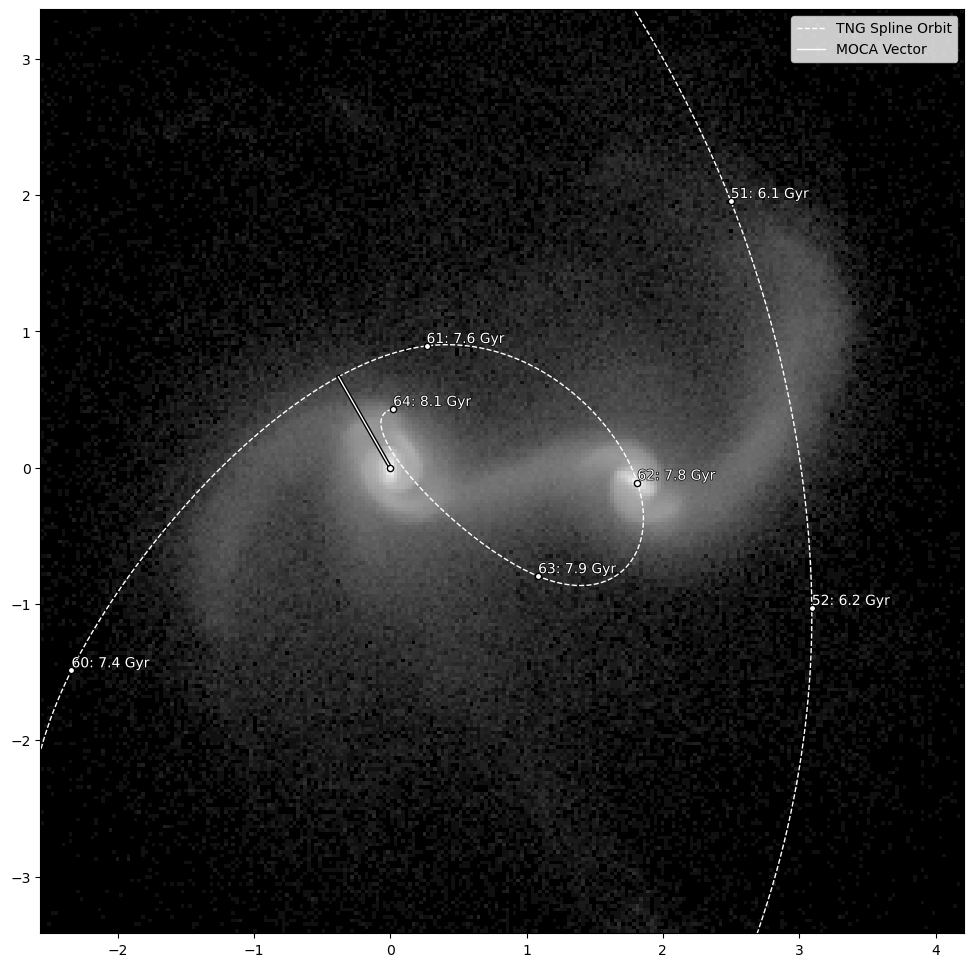

In [ ]:
class SPAM_TNG_Tuner( cts.TNG_Target_Class ):

    def simulate_orbit( self, orbit_data, graph_info = {'plot':[], 'annotations':[]}, add_plot = False, save_dir=None, overwrite = False ):

        logger.info("Simulating SPAM Orbit")
        _, spam_ar = self.generate_target_spam_array( )

        if save_dir:
            
            # Create unique hex from parameters
            sim.set_spam_parameters_from_dict( orbit_data )  # overwrite new params
            orbit_params = sim.get_spam_parameters() # get all params
            std_str = f"tng_target={self.tng_primary_id}"
            for key in orbit_params.keys():
                std_str += f"-{key}={orbit_params[key]:.5f}"
            
            for val in spam_ar:
                std_str += f"-{val:.5f}"

            hex_str = hashlib.md5( std_str.encode() ).hexdigest()
            param_ar = np.array( [ v for _,v in orbit_params.items()] )
            id_ar = np.array( [self.tng_primary_id], dtype=np.uint64 )
            save_loc = os.path.join( save_dir, f"{hex_str}.npz" )
    
        else:
            save_loc = 'None'
        
        # Check if file exists
        orbit = None
        if os.path.exists( save_loc ) and not overwrite:
            try:
                logger.info( f"Loading Orbit: {save_loc}" )
                with np.load( save_loc ) as data:
                    orbit = data['orbit']

            except:
                pass
        
        # If orbit is not loaded, generate it
        if orbit is None:
            orbit = sim.spam_orbit( spam_ar, current_time=self.moca['current']['time_su'], spam_setup_params=orbit_data )
            
            # Save the orbit if save_dir is given
            if save_dir:
                logger.info( f"Saving Orbit: {save_loc}" )

                # Save orbit to file
                np.savez( save_loc, orbit=orbit, params=param_ar, spam_ar=spam_ar, tng_target=id_ar )
                
        # Add to plot data if given
        if add_plot:
            graph_info = self.gen_spam_orbit_graph_info( orbit, orbit_data.get('name','SPAM Orbit'), graph_info )

        return orbit, graph_info

if buildEnv:
     # Set logger level
    logger.setLevel(logging.WARNING)

    # Target IDs
    p1 = 62000000190717

    # Load the TNG orbits
    test_target = DEV_SPAM_TNG_Tuner(  p1,use_spline_type = 'natural',  )

    # check if class has attr 'pts'
    print( f"Target pts: {hasattr(test_target, 'pts')}" )

    # Empty items default to SPAM Default
    # spam_param = {}
    # spam_param['Default'] = {}
    # spam_param['Off Time'] = { 'm_halo': 8, 'lnl': 0.05 }
    # spam_param['Hand Found'] = { 'm_halo': 12, 'lnl': 0.01, 'r_scale': 20 }

    

    # Create save location for orbits
    save_dir = f"{PROJECT_DIRECTORY}/../data/misc_spam_orbits/"
    save_dir = os.path.abspath( save_dir )

    if not os.path.exists( save_dir ):
        os.makedirs( save_dir )

    print( f"Orbit Save Loc: ({os.path.exists(save_dir)}) - {save_dir}" )

    # Create container for spam parameters and orbits of interest
    test_data = {}
    test_data['orbits'] = {}
    test_data['orbits']['Default'] = { 'name':'Default'}
    test_data['orbits']['Hand Found'] = { 'name':'Hand-Found','m_halo': 8, 'lnl': 0.006, 'r_scale': 22 }
    test_data['orbits']['Off Time'] = { 'name':'Off-Time', 'm_halo': 6, 'lnl': 0.01, 'r_scale': 16 }
    test_data['graph_info'] = {'plot':test_target.plot_base, 'annotations':test_target.base_annotations}

    # Add Default SPAM Parameters
    # print( f"Simulating Orbit: Default" )
    ow = False
    test_data['orbits']['Default']['orbit'], test_data['graph_info'] = test_target.simulate_orbit( test_data['orbits']['Default'], test_data['graph_info'], save_dir=save_dir, overwrite=ow )
    test_data['orbits']['Hand Found']['orbit'], test_data['graph_info'] = test_target.simulate_orbit( test_data['orbits']['Hand Found'], test_data['graph_info'], save_dir=save_dir, overwrite=ow )
    test_data['orbits']['Off Time']['orbit'], test_data['graph_info'] = test_target.simulate_orbit( test_data['orbits']['Off Time'], test_data['graph_info'], save_dir=save_dir, overwrite=ow )

    test_target.graph_target( overwrite_plots=test_data['graph_info']['plot'], overwrite_annotations=test_data['graph_info']['annotations'] )

    if True:
        
        # Test target 2
        p2 = 75000000121160
        tng_target_2 = DEV_SPAM_TNG_Tuner( p2, use_spline='hermite' )

        test_data_2 = {}
        test_data_2['orbits'] = {}
        test_data_2['orbits']['Default'] = { 'name':'Default'}
        test_data_2['orbits']['Hand Found'] = { 'name':'Hand-Found','m_halo': 6.4, 'lnl': 0.007, 'r_scale': 20 }
        test_data_2['orbits']['Off Time'] = { 'name':'Off-Time', 'm_halo': 9, 'lnl': 0.04, 'r_scale': 6 }
        test_data_2['graph_info'] = {'plot':tng_target_2.plot_base, 'annotations':tng_target_2.base_annotations}

        # Add Default SPAM Parameters
        print( f"Simulating Orbit: Default" )
        test_data_2['orbits']['Default']['orbit'], test_data_2['graph_info'] = tng_target_2.simulate_orbit( test_data_2['orbits']['Default'], test_data_2['graph_info'] )
        test_data_2['orbits']['Hand Found']['orbit'], test_data_2['graph_info'] = tng_target_2.simulate_orbit( test_data_2['orbits']['Hand Found'], test_data_2['graph_info'] )
        test_data_2['orbits']['Off Time']['orbit'], test_data_2['graph_info'] = tng_target_2.simulate_orbit( test_data_2['orbits']['Off Time'], test_data_2['graph_info'] )
        # tng_target_2.graph_target( overwrite_plots=test_data_2['graph_info']['plot'], overwrite_annotations=test_data_2['graph_info']['annotations'] )
    


# raise Exception("End Script")

---
---
# Orbit Similarity Function
## Inital Problems
While trying a few simple fitness function's for comparing the TNG and SPAM simulation, I came across 2 primary issues:

1) The SPAM simulation ends early if galaxies are not likely to merge.  This is to preserve computational resources for other SPAM runs. 
2) The SPAM and TNG starting parameters are identical (since they use the same starting parameters).  Thus SPAM runs that end early, have orbit paths that are very close to TNG. 

## Solution
Accordinging to literature, the tidal features of merging galaxies are highly influenced by the moment of closest approach (when the two galaxies are closest), because that is when tidal forces are highest.  Therefore, I decided to implement two aspects to the orbit similarity fitness function that keeps this in mind. 

2) **Fixed Time Frame** - Calculate a fixed time frame centered around the moment of closest approach in TNG.  If the SPAM orbit ends early (fails to simulate far enough back in time) it will be punished.
1) **Weighted Fitness Function** - Give more importance to the weight function centered on the moment of closest approach.  Have weights drop the further you are from this point.   


NOTE: A cautious about wording orbit times within SPAM simulation.  The SPAM simulation takes collision parameters for the **current** moment (what we observe) and simulates an orbit of the galaxies *backwards* in time.   Thus, the start of the orbit simuation is **fixed** at the final position and time, and integrates backwards to earlier times/positions of the orbit.  Making the end of the simulation the **starting** time.  I make this note it has caused some confusion while coding and explaining to others. 

---
---



### Weighted Fitness Function

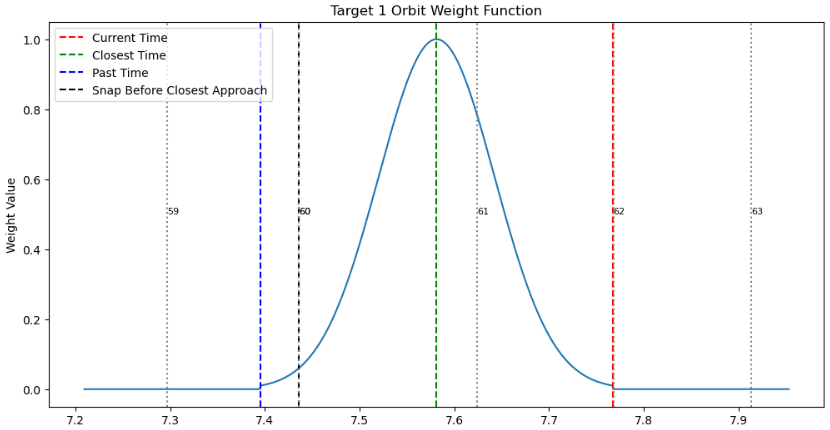

Time:2025-02-24 16:36:08,972 - [convert_tng_to_spam.__init__] - INFO - Initializing TNG Target Class...


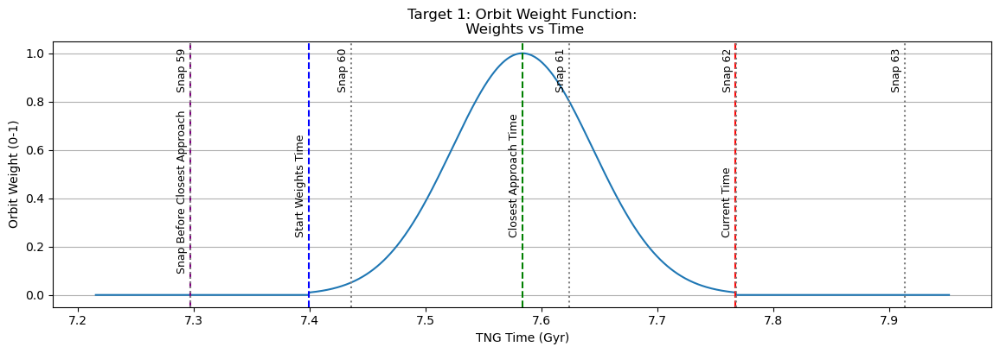

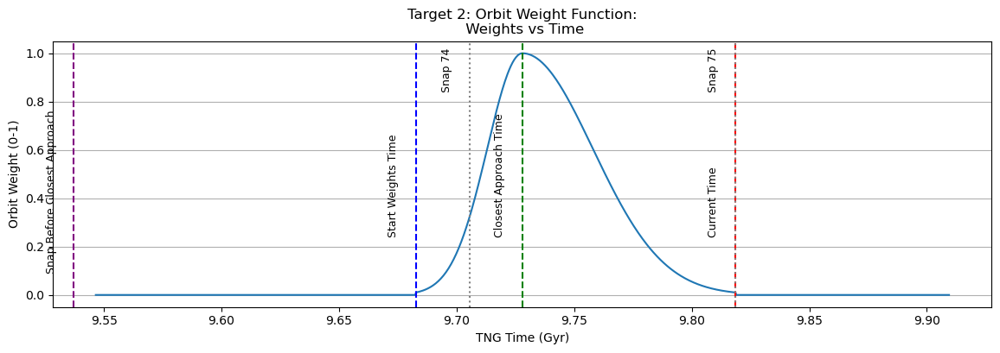

<Figure size 640x480 with 0 Axes>

In [ ]:
def gen_orbit_weight_func_of_closest_approach( self, boundary_value = 0.01, scale_past = 1.0 ):
    """
    Generate weight related variables and a gaussian function centered on the moment of closest approach.
    Meant to weigh a fitness function comparing TNG and SPAM orbits.
    The weighting function will be zero outside of the past and current times of the orbit.

    path: dict - Accumlated orbit path information for a particular TNG target
    weight_boundary: float (0,1) - The value of the weighting function at current time.
    scale_past: float (Defualt 1.0) - Scale the weighting function for times before the closest approach.
    """

    # Build dictionary to contain variables and weight function
    self.orbit_weights = {}

    # Weight function variables
    self.orbit_weights['delta_time'] = self.moca['current']['time_su'] - self.moca['closest']['time_su']
    self.orbit_weights['start_time'] = self.moca['closest']['time_su'] - self.orbit_weights['delta_time'] * scale_past

    start_time = self.orbit_weights['start_time']
    current_time = self.moca['current']['time_su']
    closest_time = self.moca['closest']['time_su']
    gaussian_weight_after = - ( self.orbit_weights['delta_time']**2 / (2 * np.log( boundary_value ) ) )
    gaussian_weight_before = - ( (scale_past*self.orbit_weights['delta_time'])**2 / (2 * np.log( boundary_value ) ) )

    def weight_func( time ):
        """
        Generate the weight for a given time
        """

        # If a list or array, recursively apply the function to each element
        if isinstance(time, list) or isinstance(time, np.ndarray):
            return np.array([ weight_func( t ) for t in time ])

        # If outside of weight range, return 0
        if time < start_time:    return 0
        elif time > current_time:    return 0

        # between closest and current time
        elif time > closest_time:    
            return np.exp( -( (time - closest_time)**2 / (2*gaussian_weight_after) ) )

        # else between start and closest time
        else:    
            return np.exp( -( (time - closest_time)**2 / (2*gaussian_weight_before) ) )
    
    self.weight_function = weight_func

    return weight_func
    
setattr( DEV_SPAM_TNG_Tuner, 'gen_orbit_weights', gen_orbit_weight_func_of_closest_approach )

def plot_weight_function( tng_target, title = "Orbit Weight Function" ):
    """
    Plot the weight function for the given path
    """

    # Generate test times
    plot_start = tng_target.moca['inbound']['time_su']-tng_target.orbit_weights['delta_time']
    plot_end = tng_target.moca['current']['time_su']+tng_target.orbit_weights['delta_time']
    plot_times_su = np.linspace( plot_start, plot_end, 1000 )
    plot_weights = tng_target.weight_function( plot_times_su )
    plot_times_tng = cts.convert_time_spam_to_tng( plot_times_su )

    plt.clf()
    plt.plot( plot_times_tng, plot_weights )

    plt.title(title)
    plt.xlabel("TNG Time (Gyr)")
    plt.ylabel("Orbit Weight (0-1)")

    #
    t_off = -0.012
    t_font = 9

    # Add vertical dash lines for current, past, and closest times
    c_val = cts.convert_time_spam_to_tng( tng_target.moca['current']['time_su'])
    plt.axvline( c_val, color='r', linestyle='--', label='Current Time' )
    plt.text( c_val+t_off, 0.25, f"Current Time", rotation=90, fontsize=t_font, )

    t_val = cts.convert_time_spam_to_tng( tng_target.moca['closest']['time_su'] )
    plt.axvline( t_val, color='g', linestyle='--', label='Closest Time' )
    plt.text( t_val+t_off, 0.25, f"Closest Approach Time", rotation=90, fontsize=t_font, )

    p_val = cts.convert_time_spam_to_tng( tng_target.orbit_weights['start_time'] )
    plt.axvline( p_val, color='b', linestyle='--', label='Weight Start Time' )
    plt.text( p_val+t_off, 0.25, f"Start Weights Time", rotation=90, fontsize=t_font, )

    # Show time of snap before closest approach
    sb_val = cts.convert_time_spam_to_tng( tng_target.moca['inbound']['snap_time_su'] )
    plt.axvline( sb_val, color='purple', linestyle='--', label='Snap Before Closest Approach' )
    plt.text( sb_val+t_off, 0.1, f"Snap Before Closest Approach", rotation=90, fontsize=t_font, )
    
    # Add snap times and lines to plot
    snap_list = []

    for i in range(len(tng_target.all_info['snap'])):

        # If between plot time, add to plot
        if tng_target.all_info['times_su'][i] > plot_start and tng_target.all_info['times_su'][i] < plot_end:
            # snap_list.append(tng_target['snaps'][i] )
            s_val = cts.convert_time_spam_to_tng( tng_target.all_info['times_su'][i] )
            plt.axvline( s_val, color='grey', linestyle=':', )
            plt.text( s_val+t_off, 0.85, f"Snap {tng_target.all_info['snap'][i]}", rotation=90, fontsize=t_font )

    # Make plot bigger
    plt.gcf().set_size_inches(14, 4)

    # Add only horizontal gridlines
    plt.grid(axis='y')

    # # Legend
    # plt.legend()
    plt.show()
    plt.clf()
    
# end function
    
if buildEnv:
    logger.setLevel(logging.INFO)

    test_target = DEV_SPAM_TNG_Tuner( p1, dev_print = False, use_spline='natural' )
    gen_orbit_weight_func_of_closest_approach( test_target )
    plot_weight_function( test_target, title="Target 1: Orbit Weight Function:\n Weights vs Time" )

    # p2 = 75000000121160
    # tng_target_2 = DEV_SPAM_TNG_Tuner( p2, dev_print = False, use_spline='hermite' )
    gen_orbit_weight_func_of_closest_approach(tng_target_2, boundary_value = 0.01, scale_past = 0.5)
    plot_weight_function( tng_target_2, title="Target 2: Orbit Weight Function:\n Weights vs Time" )


## Weighted Orbit Similarity Fitness Function

Here is the basis for this function.

1) Sets a fixed time frame to score, based on spline of TNG orbit centered around the moment of closest approach.  
1) It takes the time steps from the SPAM orbit.  If shorter than fixed time frame, it extends to the timesteps to the full time.
1) Those timesteps are used to generate weight values and positions from the TNG orbit spline.  
1) Iterates over each time step, calculating the distance squared between orbit positions.  
1) If SPAM does not go fully back in time, the function iterates over the remaining TNG orbit and computes the difference between it and the starting SPAM position.
1) Weights are applied to the errors, and normalized so it's the average weighted error.  

1) TODO: Consider making area under the curve the same, before and after.  But, make it so the inbound stretches back further.  


In [ ]:
def weighted_avg_error_sq_over_by_time( self, spam_orbit, weight_func = None ):

    logger.info("Score Function for Orbit Similarity by Time")

    # Get info from SPAM orbit
    n_spam = len(spam_orbit)  # length of spam run
    spam_times = spam_orbit[:,-1]  # Times in spam run

    logger.debug("SPAM Orbit: %s", spam_orbit.shape)
    logger.debug( f"SPAM Time: {spam_times[0]:.2f} - {spam_times[-1]:.2f} Gyr")

    # If spam run ends before the inbound time, add more time steps
    if spam_times[0] > self.moca['inbound']['time_su']:
        logger.debug("SPAM run ended before reaching inbound time")

        # Get steps needed to fill the gap between inbound time and spam start
        spam_dt = abs((spam_times[-1] - spam_times[0]) / (n_spam - 1))
        n_more = int( np.ceil( (spam_times[0] - self.moca['inbound']['time_su']) / spam_dt ) )
        logger.debug( f"Adding {n_more} more time steps to SPAM run")
        logger.debug( f"SPAM Times: {spam_times.shape}")
        logger.debug( f"{spam_times[:3]} - {spam_times[-3:]}")

        # Create new time array that stretches the gap
        new_times = np.linspace( self.moca['inbound']['time_su'], spam_times[0], n_more )        
        logger.debug( f"New Times: {new_times.shape}")
        logger.debug( f"{new_times[:3]} - {new_times[-3:]}")
        
        # Combine SPAM and new times
        times = np.concatenate( (new_times, spam_times) )

    # Else use the spam run times
    else:
        n_more = 0
        times = spam_times

    # Log time steps
    logger.debug( f"Comparing Times: {times.shape}")
    logger.debug( f"{times[:3]} - {times[-3:]}")

    # Create presumed tng_orbit using spline and times
    n = len(times)  # length of times array
    tng_spline_orbit = self.generate_tng_spline_orbit( times )
    logger.debug( f"TNG Spline Orbit: {tng_spline_orbit.shape}")
    
    # Create weights from tng_orbit
    if weight_func is None:
        weights = self.weight_function( times )
    else:
        weights = weight_func( times )
        
    logger.debug( f"Weights: {weights.shape}")

    # Loop through orbits and compute errors
    errors = np.zeros(n)
    for i in range(n):

        # If time is less than SPAM start, compare to spam's starting point
        if i < n_more:
            e = np.linalg.norm(spam_orbit[0,0:3] - tng_spline_orbit[i,0:3]) ** 2
        
        # Else compare orbits at same time step
        else:
            spam_idx = i - n_more
            e = np.linalg.norm(spam_orbit[spam_idx,0:3] - tng_spline_orbit[i,0:3]) ** 2

        errors[i] = e

    logger.debug( f"Errors: {errors.shape}")

    # Calcule normalization factor for normalized weighted error
    total_weight = np.sum(weights)
    E = np.sum(weights * errors)
    E_normalized = E / total_weight

    logger.debug( f"Total Weight: {total_weight}")
    logger.debug( f"Total Error: {E}")
    logger.debug( f"Weighted Error: {E_normalized}")

    return E_normalized

setattr( DEV_SPAM_TNG_Tuner, 'weighted_avg_error_sq_over_by_time', weighted_avg_error_sq_over_by_time )

if buildEnv:

    logger.setLevel(logging.INFO)

    test_target = DEV_SPAM_TNG_Tuner(  p1,use_spline_type = 'natural',  )
    wf_2 = test_target.gen_orbit_weights( boundary_value = 0.1, scale_past = 0.5 )
    wf_1 = test_target.gen_orbit_weights( boundary_value = 0.01, scale_past = 1.0 )

    for key in test_data['orbits']:
        test_data['orbits'][key]['score_by_time_v1'] = test_target.weighted_avg_error_sq_over_by_time( test_data['orbits'][key]['orbit'], weight_func = wf_1 )
        test_data['orbits'][key]['score_by_time_v2'] = test_target.weighted_avg_error_sq_over_by_time( test_data['orbits'][key]['orbit'], weight_func = wf_2 )
        print( f"Score v1: {key} - {test_data['orbits'][key]['score_by_time_v1']:.5f}" )
        print( f"Score v2: {key} - {test_data['orbits'][key]['score_by_time_v2']:.5f}" )

    test_target = DEV_SPAM_TNG_Tuner(  p1,use_spline_type = 'natural',  )
    test_target.gen_orbit_weights( boundary_value = 0.01, scale_past = 0.5 )

    for key in test_data['orbits']:
        test_data['orbits'][key]['score_by_time'] = test_target.weighted_avg_error_sq_over_by_time( test_data['orbits'][key]['orbit'] )
        print( f"Score: {key} - {test_data['orbits'][key]['score_by_time']:.5f}" )
    
    test_target_2 = DEV_SPAM_TNG_Tuner( p2, use_spline_type = 'hermite', )
    test_target_2.gen_orbit_weights( boundary_value = 0.01, scale_past = 2.0 )


    for key in test_data_2['orbits']:
        test_data_2['orbits'][key]['score_by_time'] = test_target_2.weighted_avg_error_sq_over_by_time( test_data_2['orbits'][key]['orbit'] )
        print( f"Target 2 Score: {key} - {test_data_2['orbits'][key]['score_by_time']:.5f}" )


Time:2025-02-24 16:36:12,610 - [convert_tng_to_spam.__init__] - INFO - Initializing TNG Target Class...
Time:2025-02-24 16:36:15,354 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time
Time:2025-02-24 16:36:15,607 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time
Time:2025-02-24 16:36:15,852 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time


Score v1: Default - 3.66072
Score v2: Default - 2.21915


Time:2025-02-24 16:36:16,103 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time
Time:2025-02-24 16:36:16,361 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time


Score v1: Hand Found - 0.04614
Score v2: Hand Found - 0.02277


Time:2025-02-24 16:36:16,625 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time
Time:2025-02-24 16:36:16,876 - [convert_tng_to_spam.__init__] - INFO - Initializing TNG Target Class...


Score v1: Off Time - 0.63028
Score v2: Off Time - 0.54821


Time:2025-02-24 16:36:19,829 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time
Time:2025-02-24 16:36:20,086 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time


Score: Default - 2.00391


Time:2025-02-24 16:36:20,343 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time


Score: Hand Found - 0.02064


Time:2025-02-24 16:36:20,598 - [convert_tng_to_spam.__init__] - INFO - Initializing TNG Target Class...


Score: Off Time - 0.65786


Time:2025-02-24 16:36:24,521 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time
Time:2025-02-24 16:36:24,670 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time
Time:2025-02-24 16:36:24,817 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time


Target 2 Score: Default - 0.67420
Target 2 Score: Hand Found - 0.37750
Target 2 Score: Off Time - 0.78478


<Figure size 640x480 with 0 Axes>

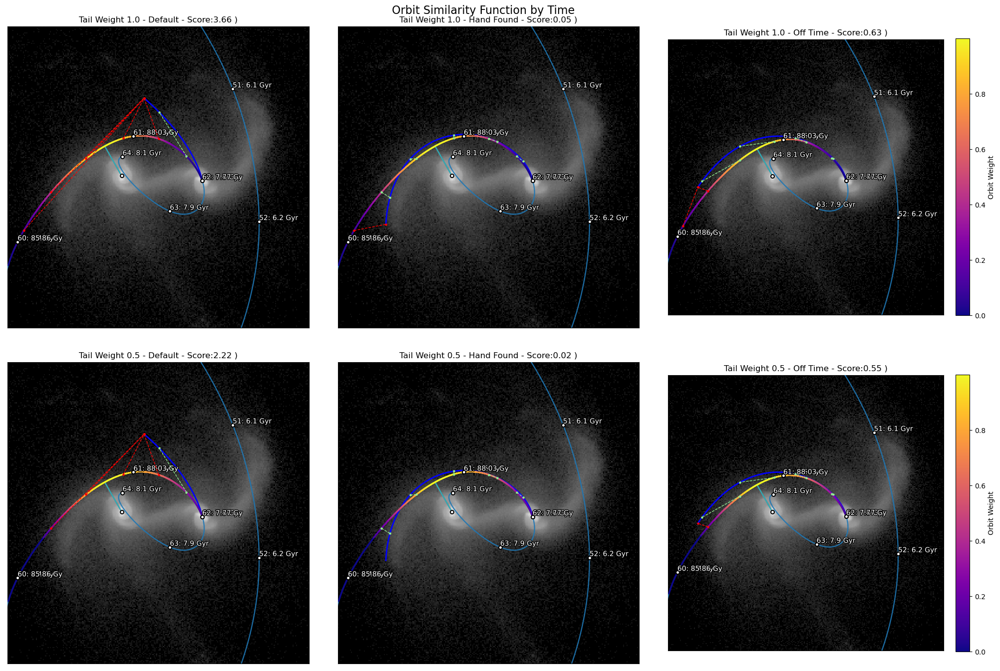

In [ ]:
def plot_weighted_error_by_time( tng_target, test_data, spam_orbit, orbit_name = 'SPAM Orbit', 
                                     title = "Orbit Similarity Function", weight_func = None,
                                     ext_ax=None, show_label=False, show_colorbar=True,
                                      overwrite_pts = None ):

    plots = deepcopy( tng_target.plot_base )
    annotations = deepcopy( tng_target.base_annotations )

    # Add current position
    annotations.append(( spam_orbit[-1,0:2], f"{tng_target.moca['current']['snap']}: {tng_target.moca['current']['time_tu']:.2f} Gy" ))
    logger.debug( f"MOCA:"
                + f"\nStart: {tng_target.moca['inbound']['time_su']:.2f}"
                + f"\nFinal: {tng_target.moca['current']['time_su']:.2f}" )

    # Append snaps only between past and current times, excluding current
    for i in range(len(tng_target.all_info['snap'])):
        if tng_target.all_info['times_su'][i] < tng_target.moca['current']['time_su'] and tng_target.all_info['times_su'][i] > tng_target.moca['inbound']['time_su']:
            annotations.append(( tng_target.orbit['spam_frame_spam_units'][i], f"{tng_target.all_info['snap'][i]}: {tng_target.all_info['times_su'][i]:.2f} Gy" ))
    
    tmp_plot = [ np.array(p) for p,l in plots ]
    tmp_plot_labels = [ l for p,l in plots ]

    # Create an ax for plotting if none given
    if ext_ax is None:
        fig, ax = plt.subplots()
    else:
        ax = ext_ax
    

    if overwrite_pts is None:
        pts = tng_target.pts
    else:
        pts = overwrite_pts

    # Plot pts
    tf.xy_histogram( 
        pts, 
        plot_data = tmp_plot, 
        plot_labels = tmp_plot_labels, 
        show_labels = show_label, 
        std_dev = 3,
        annotations= annotations,
        title = title,
        ext_ax = ax,
        # figsize=(10,10)
    )

    # # Get times from spam orbit 
    spam_times = spam_orbit[:,-1]

    logger.debug( f"SPAM Orbit:"
            + f"\nStart: {spam_orbit[0]}"
            + f"\nFinal: {spam_orbit[-1]}" )

    if spam_times[0] > tng_target.moca['inbound']['time_su']:
        n_more = int( np.ceil( (spam_times[0] - tng_target.moca['inbound']['time_su']) / abs(spam_times[1] - spam_times[0]) ) )
        new_times = np.linspace( tng_target.moca['inbound']['time_su'], spam_times[0], n_more )        
        times = np.concatenate( (new_times, spam_times) )
    else:
        n_more = 0
        times = spam_times
    
    # get weight function based on times.
    if weight_func is None:
        plot_weights = tng_target.weight_function( times )
    else:
        plot_weights = weight_func( times )

    # # Create tng_orbit for those times
    spline_orbit = tng_target.generate_tng_spline_orbit( times )

    logger.debug( f"Spline Orbit:"
            + f"\nStart: {spline_orbit[0]}"
            + f"\nFinal: {spline_orbit[-1]}" )

    # us ax plot
    ax.plot( spam_orbit[:,0], spam_orbit[:,1], 'b-', label='SPAM Orbit', linewidth=2 )
    
    # # Iterate over times to plot n differences
    n = 7
    for i in range( n ):
        idx = int(i * len(times) / n)

        # Skip if weight is zero
        if plot_weights[idx] == 0:
            continue

        pos_tng = spline_orbit[idx]
        if idx < n_more:
            pos_spam = spam_orbit[0]
            color = 'r'
        else:
            pos_spam = spam_orbit[idx-n_more]
            color = 'lightgreen'

        ax.plot( [pos_tng[0], pos_spam[0]], [pos_tng[1], pos_spam[1]], zorder=10, linewidth=1, linestyle='--', color=color )
        ax.scatter( [pos_tng[0], pos_spam[0]], [pos_tng[1], pos_spam[1]], zorder=10, s=5, color=color )

    # # Create positions from spline and times

    # # Add weight values to plot
    sk = 1

    sc = ax.scatter( spline_orbit[::sk,0], spline_orbit[::sk,1], c=plot_weights[::sk], cmap='plasma', s=1, zorder=5 )

    # make color bar smaller
    if show_colorbar:
        plt.colorbar(sc, label='Orbit Weight', fraction=0.046, pad=0.04)

    ax.legend().remove()

if buildEnv:

    logger.setLevel(logging.INFO)

    # # Create large plot 
    plt.clf()
    fig, ax = plt.subplots(2,3, figsize=(20,14))

    fig.suptitle("Orbit Similarity Function by Time", fontsize=16)
    fig.tight_layout()

    # logger.setLevel(logging.INFO)
    for i, k in enumerate(test_data['orbits']):
        if i == 2: show_bar = True
        else: show_bar = False
        plot_weighted_error_by_time( test_target, test_data, test_data['orbits'][k]['orbit'], 
                                      title=f"Tail Weight {1.0} - {k} - Score:{test_data['orbits'][k]['score_by_time_v1']:.2f} )", 
                                      ext_ax = ax[0,i], show_label=False, show_colorbar=show_bar, weight_func=wf_1 )
        
        plot_weighted_error_by_time( test_target, test_data, test_data['orbits'][k]['orbit'], 
                                      title=f"Tail Weight {0.5} - {k} - Score:{test_data['orbits'][k]['score_by_time_v2']:.2f} )", 
                                      ext_ax = ax[1,i], show_label=False, show_colorbar=show_bar, weight_func=wf_2 )
    
if buildEnv and False:
    
    # Target 2
    # Create large plot
    plt.clf()
    fig, ax = plt.subplots(1,3, figsize=(20,7))
    fig.suptitle("Target 2: Orbit Similarity Function by Time", fontsize=16)
    fig.tight_layout()
    # logger.setLevel(logging.INFO)
    for i, k in enumerate(test_data_2['orbits']):
        plot_weighted_error_by_time( tng_target_2, test_data_2, test_data_2['orbits'][k]['orbit'], 
                                      title=f"{k} (score:{test_data_2['orbits'][k]['score_by_time']:.2f} )", 
                                      ext_ax = ax[i], show_label=False )
        

In [ ]:
def weighted_avg_error_sq_by_pos( self, spam_orbit, weight_func = None ):
    """
    This function will compare the SPAM orbit to the TNG orbit based on nearest position.  
    It will iterate over the TNG orbit and calculate the distance to the nearest SPAM orbit position.
    Also considers a weighting function that gives more weight to the closest approach time.

    inputs:
    spam_orbit: np.array [x,y,z,vx,vy,vz,t] - SPAM orbit positions, velocities, and times

    """

    logger.info("Score Function for Orbit Similarity by Position")
    logger.debug("SPAM Orbit: %s", spam_orbit.shape)

    # Since we've using the TNG orbit as a basis
    start_time = self.moca['inbound']['time_su']
    final_time = self.moca['current']['time_su']

    # Grab TNG Spline Orbit between time frame
    tng_sub_orbit = self.spline_orbit[ (self.spline_orbit[:,-1] >= start_time) & (self.spline_orbit[:,-1] <= final_time) ]
    logger.debug( f"TNG Orbit - MOCA sub-spline: {tng_sub_orbit.shape}")

    # Loop through orbits and compute errors
    n = tng_sub_orbit.shape[0]
    errors = np.zeros(n)
    for i in range(n):

        # Find the closest SPAM orbit position
        spam_pos = spam_orbit[:,0:3]
        tng_pos = tng_sub_orbit[i,0:3]
        dist_ar = np.linalg.norm( spam_pos - tng_pos, axis=1 )
        min_dist = np.amin( dist_ar )

        # error is distance squared
        errors[i] = min_dist ** 2

    logger.debug( f"Errors: {errors.shape}")

    # # Calcule normalization factor for normalized weighted error
    if weight_func is None:
        weights = self.weight_function( tng_sub_orbit[:,-1] )
    else:
        weights = weight_func( tng_sub_orbit[:,-1] )

    total_weight = np.sum(weights)
    E = np.sum(weights * errors)
    E_normalized = E / total_weight

    logger.debug( f"Weighted Error: {E_normalized}")

    return E_normalized

setattr( DEV_SPAM_TNG_Tuner, 'weighted_avg_error_sq_by_pos', weighted_avg_error_sq_by_pos )

if buildEnv:

    logger.setLevel(logging.INFO)

    test_target = DEV_SPAM_TNG_Tuner(  p1,use_spline_type = 'natural',  )
    wf1 = test_target.gen_orbit_weights( boundary_value = 0.01, scale_past = 1.0 )
    wf2 = test_target.gen_orbit_weights( boundary_value = 0.1, scale_past = 0.5 )

    logger.setLevel(logging.INFO)
    
    for key in test_data['orbits']:
        test_data['orbits'][key]['score_by_pos_v1'] = test_target.weighted_avg_error_sq_by_pos( test_data['orbits'][key]['orbit'], weight_func = wf1 )
        test_data['orbits'][key]['score_by_pos_v2'] = test_target.weighted_avg_error_sq_by_pos( test_data['orbits'][key]['orbit'], weight_func = wf2 )
        print( f"Score weight 1.0: {key} - {test_data['orbits'][key]['score_by_pos_v1']}" )
        print( f"Score weight 0.5: {key} - {test_data['orbits'][key]['score_by_pos_v2']}" )
        
    

    print("#####  TARGET 2   #####")
    test_target_2 = DEV_SPAM_TNG_Tuner( p2, use_spline_type = 'hermite', )
    test_target_2.gen_orbit_weights( boundary_value = 0.01, scale_past = 2.0 )

    for key in test_data_2['orbits']:
        test_data_2['orbits'][key]['score_by_pos'] = test_target_2.weighted_avg_error_sq_by_pos( test_data_2['orbits'][key]['orbit'] )
        print( f"Score: {key} - {test_data_2['orbits'][key]['score_by_pos']}" )

Time:2025-02-24 16:36:32,425 - [convert_tng_to_spam.__init__] - INFO - Initializing TNG Target Class...
Time:2025-02-24 16:36:35,307 - [2075155938.weighted_avg_error_sq_by_pos] - INFO - Score Function for Orbit Similarity by Position
Time:2025-02-24 16:36:35,334 - [2075155938.weighted_avg_error_sq_by_pos] - INFO - Score Function for Orbit Similarity by Position
Time:2025-02-24 16:36:35,357 - [2075155938.weighted_avg_error_sq_by_pos] - INFO - Score Function for Orbit Similarity by Position
Time:2025-02-24 16:36:35,410 - [2075155938.weighted_avg_error_sq_by_pos] - INFO - Score Function for Orbit Similarity by Position
Time:2025-02-24 16:36:35,461 - [2075155938.weighted_avg_error_sq_by_pos] - INFO - Score Function for Orbit Similarity by Position
Time:2025-02-24 16:36:35,502 - [2075155938.weighted_avg_error_sq_by_pos] - INFO - Score Function for Orbit Similarity by Position
Time:2025-02-24 16:36:35,543 - [convert_tng_to_spam.__init__] - INFO - Initializing TNG Target Class...


Score weight 1.0: Default - 3.4549488473322194
Score weight 0.5: Default - 1.853652231143782
Score weight 1.0: Hand Found - 0.03510590485053436
Score weight 0.5: Hand Found - 0.007447736075039393
Score weight 1.0: Off Time - 0.08852999877895237
Score weight 0.5: Off Time - 0.03590701807688788
#####  TARGET 2   #####


Time:2025-02-24 16:36:38,387 - [2075155938.weighted_avg_error_sq_by_pos] - INFO - Score Function for Orbit Similarity by Position
Time:2025-02-24 16:36:38,407 - [2075155938.weighted_avg_error_sq_by_pos] - INFO - Score Function for Orbit Similarity by Position
Time:2025-02-24 16:36:38,438 - [2075155938.weighted_avg_error_sq_by_pos] - INFO - Score Function for Orbit Similarity by Position


Score: Default - 0.12614504890518613
Score: Hand Found - 0.254445307041613
Score: Off Time - 0.1287186874074444


<Figure size 640x480 with 0 Axes>

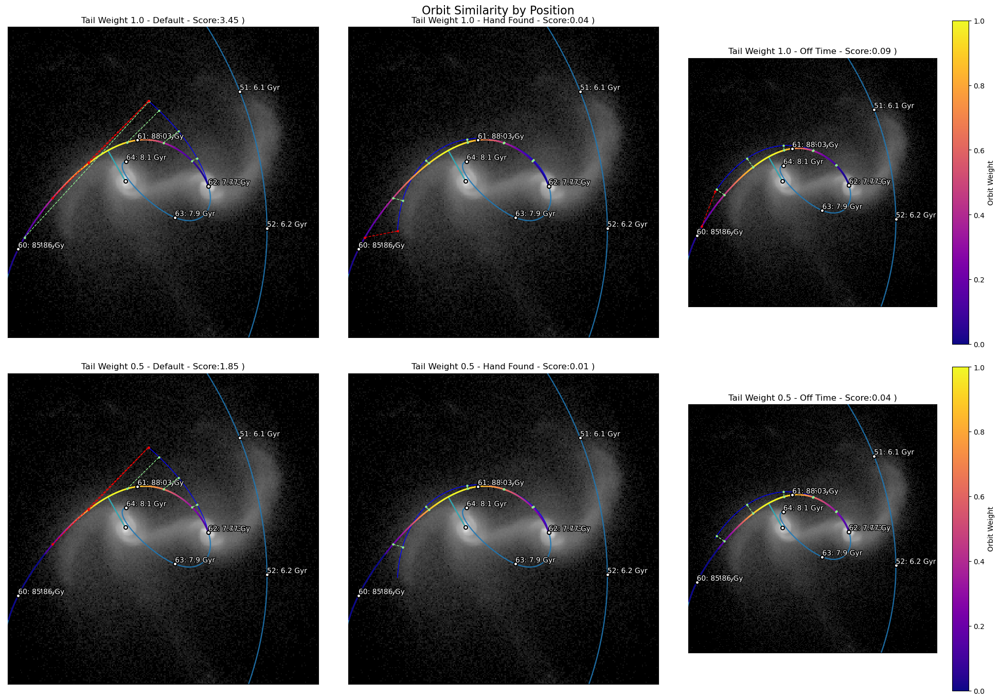

In [ ]:
def plot_weighted_error_by_pos( tng_target, test_data, spam_orbit, weight_func = None, show_colorbar=True,
                                     title = "Orbit Similarity Function", ext_ax=None, show_label=False ):

    plots = deepcopy( tng_target.plot_base )
    annotations = deepcopy( tng_target.base_annotations )

    # Add current position
    annotations.append(( spam_orbit[-1,0:2], f"{tng_target.moca['current']['snap']}: {tng_target.moca['current']['time_tu']:.2f} Gy" ))
    logger.debug( f"MOCA:"
                + f"\nStart: {tng_target.moca['inbound']['time_su']:.2f}"
                + f"\nFinal: {tng_target.moca['current']['time_su']:.2f}" )

    # Append snaps only between inbound and current times, excluding current
    for i in range(len(tng_target.all_info['snap'])):
        if tng_target.all_info['times_su'][i] < tng_target.moca['current']['time_su'] and tng_target.all_info['times_su'][i] > tng_target.moca['inbound']['time_su']:
            annotations.append(( tng_target.orbit['spam_frame_spam_units'][i], f"{tng_target.all_info['snap'][i]}: {tng_target.all_info['times_su'][i]:.2f} Gy" ))
    
    tmp_plot = [ np.array(p) for p,l in plots ]
    tmp_plot_labels = [ l for p,l in plots ]

    # Create an ax for plotting if none given
    if ext_ax is None:
        fig, ax = plt.subplots()
    else:
        ax = ext_ax

    tf.xy_histogram( 
        tng_target.pts, 
        plot_data = tmp_plot, 
        plot_labels = tmp_plot_labels, 
        show_labels = show_label, 
        std_dev = 3,
        annotations= annotations,
        title = title,
        ext_ax = ax,
        # figsize=(10,10)
    )

    # # Get times from spam orbit 
    spam_times = spam_orbit[:,-1]

    logger.debug( f"SPAM Orbit:"
            + f"\nStart: {spam_orbit[0]}"
            + f"\nFinal: {spam_orbit[-1]}" )

    tng_sub_spline = tng_target.spline_orbit[ (tng_target.spline_orbit[:,-1] >= tng_target.moca['inbound']['time_su']) & (tng_target.spline_orbit[:,-1] <= tng_target.moca['current']['time_su']) ]
    times = tng_sub_spline[:,-1]

    logger.debug( f"Spline Orbit:"
            + f"\nStart: {tng_sub_spline[0]}"
            + f"\nFinal: {tng_sub_spline[-1]}" )

    # us ax plot
    ax.plot( spam_orbit[:,0], spam_orbit[:,1], 'b-', label='SPAM Orbit', linewidth=1 )
    
    # # Iterate over times to plot n differences
    n = 7
    spam_pos = spam_orbit[:,0:3]

    if weight_func is None:
        plot_weights = tng_target.weight_function( times )
    else:
        plot_weights = weight_func( times )

    for i in range( n ):
        tng_i = int(i * len(times) / n)
        tng_pos = tng_sub_spline[tng_i,0:3]

        # If weight for time is zero, skip
        if plot_weights[tng_i] == 0:
            continue

        # Find closest SPAM position
        dist_ar = np.linalg.norm( spam_pos - tng_pos, axis=1 )
        min_i = np.argmin( dist_ar )
        min_pos = spam_pos[min_i]

        if min_i == 0 or min_i == len(spam_pos)-1:
            color = 'r'
        else:
            color = 'lightgreen'
            
        # Plot distance between TNG and SPAM positions
        ax.plot( [tng_pos[0], min_pos[0]], [tng_pos[1], min_pos[1]], zorder=10, linewidth=1, linestyle='--', color=color )
        ax.scatter( [tng_pos[0], min_pos[0]], [tng_pos[1], min_pos[1]], zorder=10, s=5, color=color )

    # # Create positions from spline and times

    # # Add weight values to plot
    sk = 1
    sc = ax.scatter( tng_sub_spline[::sk,0], tng_sub_spline[::sk,1], c=plot_weights[::sk], cmap='plasma', s=1, zorder=5 )
    if show_bar:
        plt.colorbar(sc, label='Orbit Weight')

    # # redifine limits
    # ax.set_xlim(-2.5,2)
    # ax.set_ylim(-2.5,2.0)

    if not show_label:
        ax.legend().remove()
    else:
        ax.legend()

    # plt.show()

if buildEnv:

    logger.setLevel(logging.INFO)

    # Create large plot 
    plt.clf()
    fig, ax = plt.subplots(2,3, figsize=(20,14))
    # Set big title
    fig.suptitle("Orbit Similarity by Position", fontsize=16)
    fig.tight_layout()

    for i, k in enumerate(test_data['orbits']):
        if i == 2: show_bar = True
        else: show_bar = False
        plot_weighted_error_by_pos( test_target, test_data, test_data['orbits'][k]['orbit'], 
                                      title=f"Tail Weight {1.0} - {k} - Score:{test_data['orbits'][k]['score_by_pos_v1']:.2f} )", 
                                      ext_ax = ax[0,i], show_label=False, show_colorbar=show_bar, weight_func=wf_1 )
        
        plot_weighted_error_by_pos( test_target, test_data, test_data['orbits'][k]['orbit'], 
                                      title=f"Tail Weight {0.5} - {k} - Score:{test_data['orbits'][k]['score_by_pos_v2']:.2f} )", 
                                      ext_ax = ax[1,i], show_label=False, show_colorbar=show_bar, weight_func=wf_2 )
        

<Figure size 640x480 with 0 Axes>

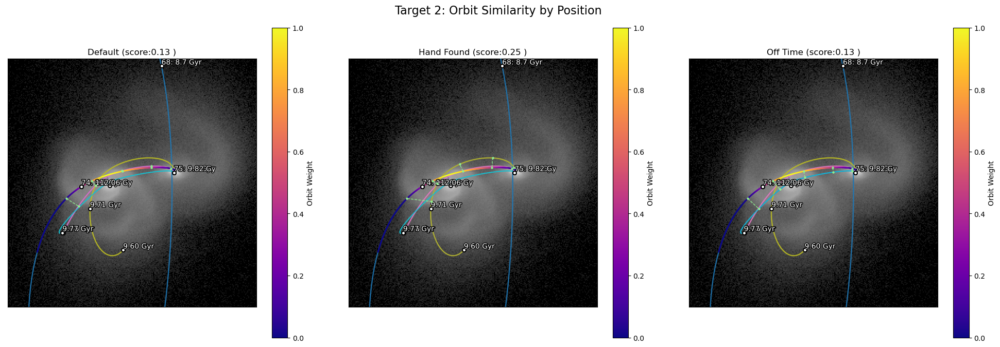

In [ ]:
if buildEnv:
    
    # Target 2
    # Create large plot
    plt.clf()
    fig, ax = plt.subplots(1,3, figsize=(20,7))
    fig.suptitle("Target 2: Orbit Similarity by Position", fontsize=16)
    fig.tight_layout()

    # logger.setLevel(logging.INFO)
    for i, k in enumerate(test_data_2['orbits']):
        plot_weighted_error_by_pos( tng_target_2, test_data_2, test_data_2['orbits'][k]['orbit'], 
                                      title=f"{k} (score:{test_data_2['orbits'][k]['score_by_pos']:.2f} )", 
                                      ext_ax = ax[i], show_label=False )

___
## Orbit Similarity Score: Avg Square Error by Time and Position

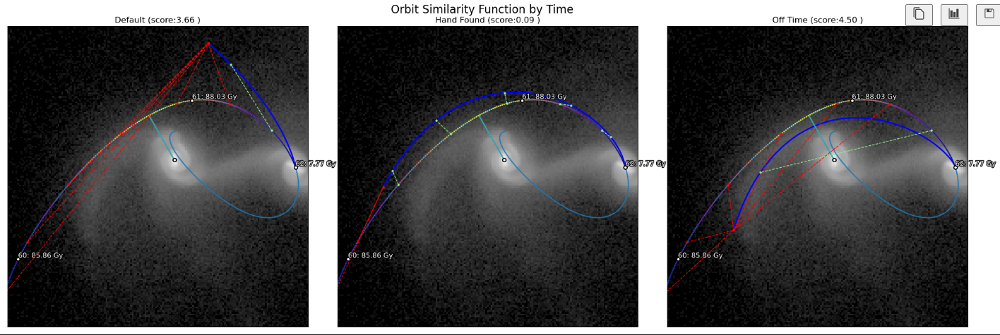

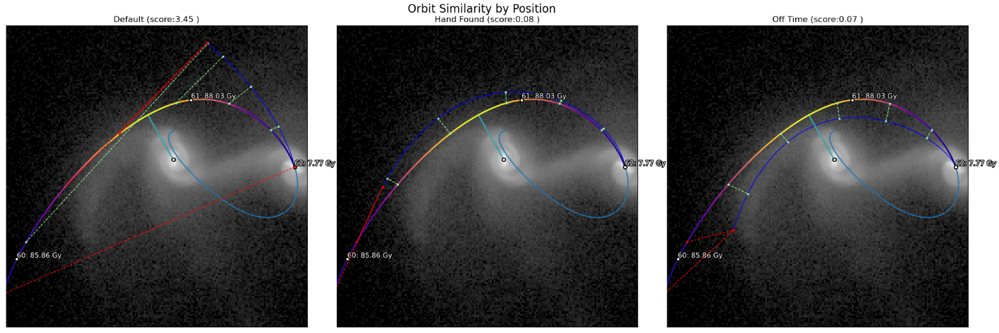

While the orbit similarity by time is ideally the best scoring function, I also thought it'd be good to have an intermediate score to "encourage" future optimizers to converge upon the orbital path earlier. 

___

# SPAM Hyperparameters and affect on Orbit.

During an earlier version of this code, I discovered 'lnl', 'r_scale', and 'm_halo' affected the orbit.  This is expected because they affect the dynamical friction or the dark matter halo, which the galaxies are likely to travel through.  But I haven't tested the other 3 yet. 

- lnl: Coefficient for Dynamical Friction.
- m_halo: Mass ratio of dark matter halo to rest of galaxy
- r_scale: Scale ratio of dark metter halo to rest of galaxy. 


### RESULTS:  'm_bulge', 'h_bulge', 'h_disk' do NOT affect orbit

It's clear they do not appear to affect the orbit, nor the tidal features it appears.  This makes sense, based on our research, the inner structure of the galaxy (bulge and disk) should not highly affect the galactic collision.  

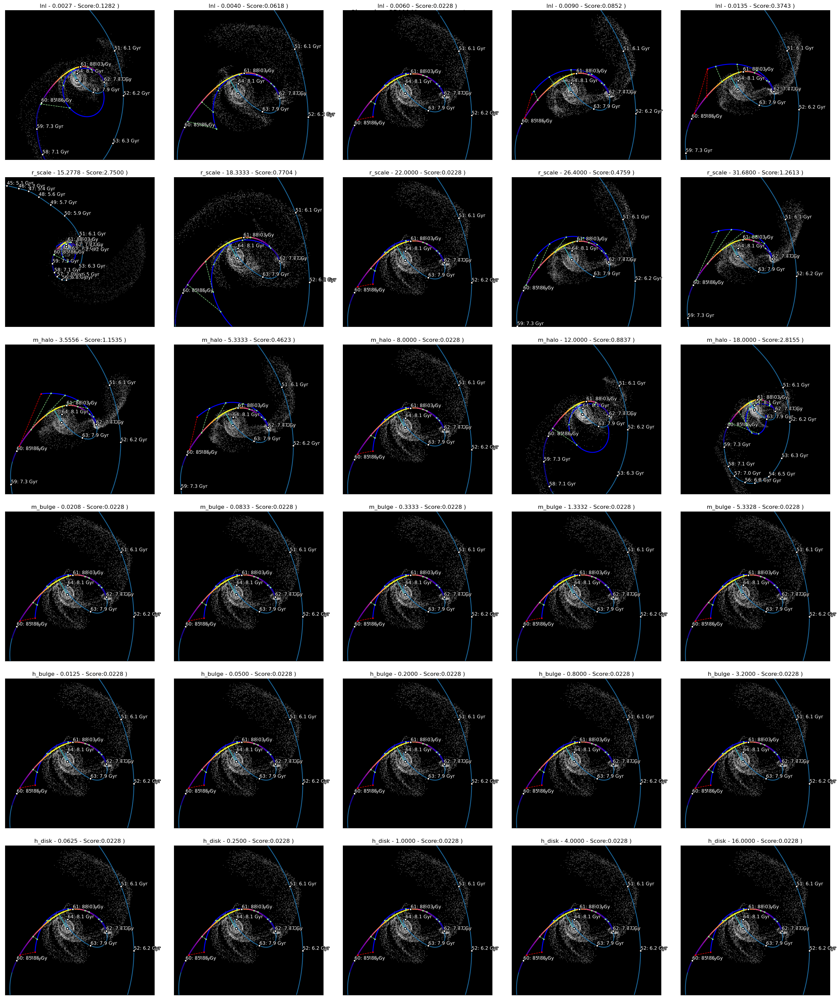

In [ ]:
if buildEnv and False:

    # Use the hand-found orbit as a basis
    param_data = {}
    param_data['base_param'] = test_data['orbits']['Hand Found']
    param_data['log_scale'] = { 
        'lnl': 1.5,
        'r_scale': 1.2,
        'm_halo': 1.5,
        'm_bulge': 4,
        'h_bulge': 4,
        'h_disk': 4,
        'base':1.5,
          }
    

    sim.set_spam_parameters_from_dict( base_param['spam_param'] )

    # Get all spam_hyperparameters 
    param_data['base_param'] = sim.get_spam_parameters()
    print( f"SPAM Hyperparameters: {param_data['base_param']}" )

    # Create list of hyperparameters to vary
    changed_param = np.zeros((len(param_data['base_param']),5))

    logger.setLevel(logging.WARNING)

    i = 0
    input_list = []
    for p_name, p_val in param_data['base_param'].items():

        # Get scale factor
        s = param_data['log_scale'].get( p_name, param_data['log_scale']['base'] )

        # Create a list of values to vary
        p_vals = [ p_val / s**2, p_val / s, p_val, p_val * s, p_val * s**2 ]

        # Store the values in the changed_param array
        changed_param[i,:] = p_vals

        if param_data.get('orbit',None) is None:
            param_data['orbit'] = {}
        
        param_data['orbit'][p_name] = {}
        
        # Loop through the values and simulate the orbit
        for j, p in enumerate(p_vals):
                
            # deep copy base param
            param_data['orbit'][p_name][(p)] = {'spam_param': deepcopy(param_data['base_param'])}
            param_data['orbit'][p_name][(p)]['spam_param'][p_name] = p  # Change the parameter

            input_list.append( param_data['orbit'][p_name][(p)]['spam_param'] )
            print( f"Loading ({i}, {j}) {p_name} - {p:.4f}", end='\r' )

        # Iterate
        i += 1

        # # Break while testing 
        # break

    def task_wrapper( sim_params ):

        orbit, _ = test_target.simulate_orbit( sim_params )
        src = test_target.weighted_avg_error_sq_over_by_time( orbit )
        _, pts = sim.basic_run( test_target.spam_ar, spam_setup_params = sim_params, npts1=4000, npts2 = 4000, heat1=0.1, heat2=0.1)
    
        return ( orbit, src, pts )    

    
    # orbit, src, pts = task_wrapper( input_list[0] )

    # plot_weighted_error_by_time( test_target, test_data, orbit, 
    #                             title=f"{p_name} - {p:.4f} - Score:{src:.4f} )", 
    #                             ext_ax = ax[0,0], show_label=False, show_colorbar=False, weight_func=wf_1, 
    #                             overwrite_pts = pts )
    
        
    logger.setLevel(logging.DEBUG)     
    task_manager = qm.Queue_Manager( task_wrapper )
    logger.setLevel(logging.WARNING)   
    output_list = task_manager.evaluate_tasks( input_list )
    logger.setLevel(logging.INFO) 
    del task_manager


In [ ]:
if buildEnv and False:
    # Create subplots
    fig, ax = plt.subplots(6,5, figsize=(25,30))
    fig.suptitle("Changing SPAM Hyperparameters", fontsize=16)
    fig.tight_layout()  
    # Plot output
    i = 0
    k = 0
    for p_name, p_val in param_data['base_param'].items():
        
        # Loop through the values and simulate the orbit
        for j, p in enumerate(param_data['orbit'][p_name]):

            
            orbit, src, pts = output_list[k]
            k += 1

            logger.warning(f"Plot ({i}x{j}): - {p_name} - {p:.4f} - {src:.4f} - {orbit.shape} orbit")

            # print( param_data['orbit'][p_name].get(p,None) )

            # save results
            # logger.warning( 'Output: %s', type(param_data['orbit'][p_name][p]) )
            param_data['orbit'][p_name][p]['orbit'] = orbit
            param_data['orbit'][p_name][p]['score'] = src
            param_data['orbit'][p_name][p]['pts'] = pts

            
            # Plot the orbit
            plot_weighted_error_by_time( test_target, test_data, orbit, 
                                        title=f"{p_name} - {p:.4f} - Score:{src:.4f} )", 
                                        ext_ax = ax[i,j], show_label=False, show_colorbar=False, weight_func=wf_1, 
                                        overwrite_pts = pts )
        i += 1
    # print( f"Changed Parameters: {changed_param}" )

____
# Testing Fitness Function on Many Orbits

Now that we have adequate scoring functions for the orbit similarity, let's do a gridsearch over the 3 variables

In [ ]:
if buildEnv and True:
    # Space Hyperparameters

    logger.setLevel(logging.INFO)

    test_target = DEV_SPAM_TNG_Tuner(  p1,use_spline_type = 'natural',  )
    wf_2 = test_target.gen_orbit_weights( boundary_value = 0.1, scale_past = 0.5 )  # See testing below

    logger.setLevel(logging.WARNING)

    import Optimization_Methods.optimization_manager as om
    
    gridseach_1 = {}
    gridseach_1['space'] = [
        {'name':'lnl', 'type': 'float', 'bounds': [1e-3, 2e-2], 'prior':'log-uniform', },
        {'name':'m_halo', 'type': 'float', 'bounds': [1, 18], 'prior':'uniform', },
        {'name':'r_scale', 'type': 'float', 'bounds': [10, 30], 'prior':'uniform', },
    ]

    # Space manager
    n = 25
    gridseach_1['space_manager'] = om.SpaceManager(gridseach_1['space'])
    # n_samples = gridseach_1['space_manager'].get_random_sample(n) # random samples
    gridseach_1['grid'] = gridseach_1['space_manager'].get_mesh_grid_points( n_pts_per_dim=n )

    # randomize rows of grid np array
    print( f"grid type: {type(gridseach_1['grid'])}")
    gridseach_1['grid'] = np.random.permutation( gridseach_1['grid'] )

    # raise Exception("Stop Here")

    print( f"Grid: {gridseach_1['grid'].shape}" )
    
    def score_wrapper_v1( spam_param_ar ):
        spam_param = { k['name']:v for k,v in zip(gridseach_1['space'],spam_param_ar) }
        logger.info("SPAM PARAMETERS: %s", spam_param)
        orbit, _ = test_target.simulate_orbit( spam_param, save_dir = '/home/mbo2d/galStuff/data/spam_tuner_gridsearch_v6' )
        score = test_target.weighted_avg_error_sq_over_by_time( orbit, weight_func = wf_2 )
        return score
    
    # Execution Manager (For parallel processing)
    # gridseach_1['exec_manager'] = om.ExecutionManager( gridseach_1['space_manager'], black_box_function=score_wrapper_v1 )
    # gridseach_1['results'] = gridseach_1['exec_manager'].evaluate_function( gridseach_1['grid'] )

    queue_manager  = qm.Queue_Manager( score_wrapper_v1 )

    gridseach_1['results'] = queue_manager.evaluate_tasks( gridseach_1['grid'] )




Time:2025-02-24 16:36:48,296 - [convert_tng_to_spam.__init__] - INFO - Initializing TNG Target Class...


grid type: <class 'numpy.ndarray'>
Grid: (15625, 3)


Time:2025-02-24 16:36:53,260 - [parallel_queue_manager._run_local_processes] - WARNING - Local Manager: Progress: [                    ] 1/15625
Time:2025-02-24 16:36:59,082 - [parallel_queue_manager._run_local_processes] - WARNING - Local Manager: Progress: [                    ] 6/15625
Time:2025-02-24 16:37:00,100 - [parallel_queue_manager._run_local_processes] - WARNING - Local Manager: Progress: [                    ] 25/15625
Time:2025-02-24 16:37:01,123 - [parallel_queue_manager._run_local_processes] - WARNING - Local Manager: Progress: [                    ] 38/15625
Time:2025-02-24 16:37:02,461 - [parallel_queue_manager._run_local_processes] - WARNING - Local Manager: Progress: [                    ] 39/15625
Time:2025-02-24 16:37:06,834 - [parallel_queue_manager._run_local_processes] - WARNING - Local Manager: Progress: [                    ] 41/15625
Time:2025-02-24 16:37:07,910 - [parallel_queue_manager._run_local_processes] - WARNING - Local Manager: Progress: [           

In [ ]:
if buildEnv:
    print( f"Gridsearch: {type(gridseach_1)}" )
    for k, v in gridseach_1.items():
        print( f"{k}: {type(v)}" )

    df.to_csv( 'to_molly_2.csv')

Gridsearch: <class 'dict'>
space: <class 'list'>
space_manager: <class 'Optimization_Methods.optimization_manager.SpaceManager'>
grid: <class 'numpy.ndarray'>
results: <class 'list'>


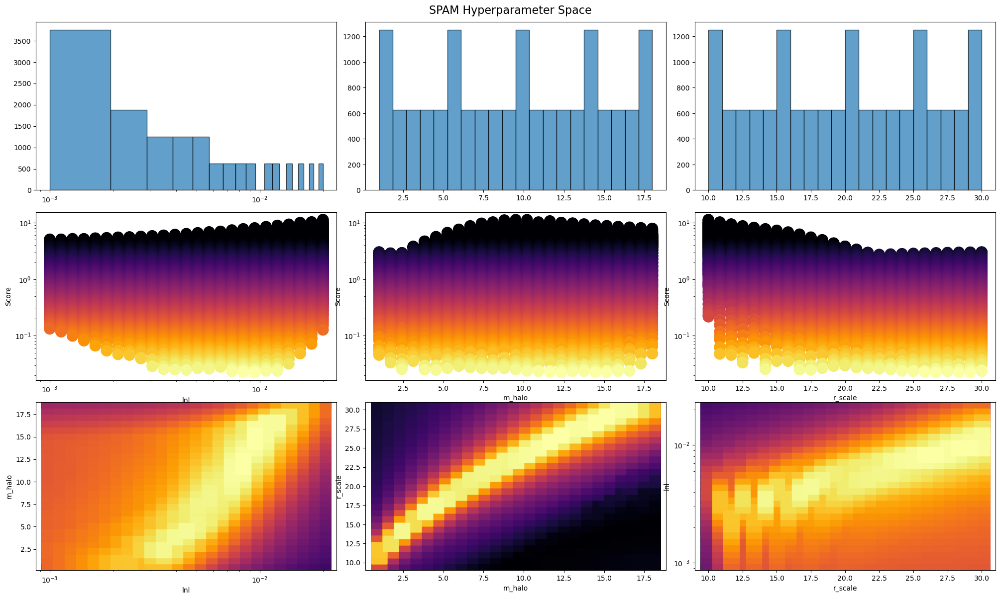

In [ ]:
import matplotlib.colors as mcolors

if buildEnv:

    fig, ax = plt.subplots(3,3, figsize=(20,12))
    fig.suptitle("SPAM Hyperparameter Space", fontsize=16)
    fig.tight_layout()

    # logger.info( f"Header: {header}")
    # logger.info( f"Results: {results.shape}")
    # logger.debug(results)

    logger.setLevel(logging.INFO )

    # x = gridseach_1['grid']
    y = gridseach_1['results']

    # Create df out of grid inputs and results
    df = pd.DataFrame( gridseach_1['grid'], columns=[k['name'] for k in gridseach_1['space']] )
    df['score'] = y

    x_names = [ k['name'] for k in gridseach_1['space'] ]

    for i, k in enumerate(gridseach_1['space']):

        # Sort df by score
        df = df.sort_values(by='score', ascending=False)
        
        # Create histogram to confirm distribution of parameters
        x = df[x_names[i]].values
        x2 = df[x_names[(i+1)%3]].values
        y = df['score'].values

        logger.debug( f"Parameter: {k['name']} - {x.shape} - {np.min(x)} - {np.max(x)} - {np.mean(x)} - {np.std(x)}")
        u = len( np.unique(x) )

        # Create histogram of x with black box around blue bar
        ax[0,i].hist(x, bins=20, edgecolor='black', alpha=0.7)
        
        if i == 0:
            # Do log scale on x axis
            ax[0,i].set_xscale('log')
        
        # Create scatter plot on 2nd row
        # ax[1,i].scatter(x, y, s=25)
        # sc = ax[1,i].scatter(v3_df[input_cols[0]], v3_df[input_cols[1]], c=v3_df[time_col], cmap='inferno_r', norm=mcolors.LogNorm(vmin=np.min(v3_df[time_col]), vmax=time_q))
        sc = ax[1,i].scatter( x, y, s=250, c=y, cmap='inferno_r', norm=mcolors.LogNorm(vmin=np.min(y), vmax=np.quantile(y,0.85)) )
        ax[1,i].set_xlabel(k['name'])
        ax[1,i].set_ylabel('Score')
        
        if i == 0:
            # Do log scale on x axis
            ax[1,i].set_xscale('log')
        
        # Log scale y axis
        ax[1,i].set_yscale('log')

        # Sort inputs and results by lowest score

        # Create 2d scatter heat plot on 3rd row
        j = (i+1)%3
        sc = ax[2,i].scatter( x, x2, s=500, c=y, cmap='inferno_r', norm=mcolors.LogNorm(vmin=np.min(y), vmax=np.quantile(y,0.85)), marker='s', )
        ax[2,i].set_xlabel(k['name'])
        ax[2,i].set_ylabel(gridseach_1['space'][j]['name'])
        
        if i == 0:
            # Do log scale on x axis
            ax[2,i].set_xscale('log')
        if j == 0:
            # Do log scale on x axis
            ax[2,i].set_yscale('log')



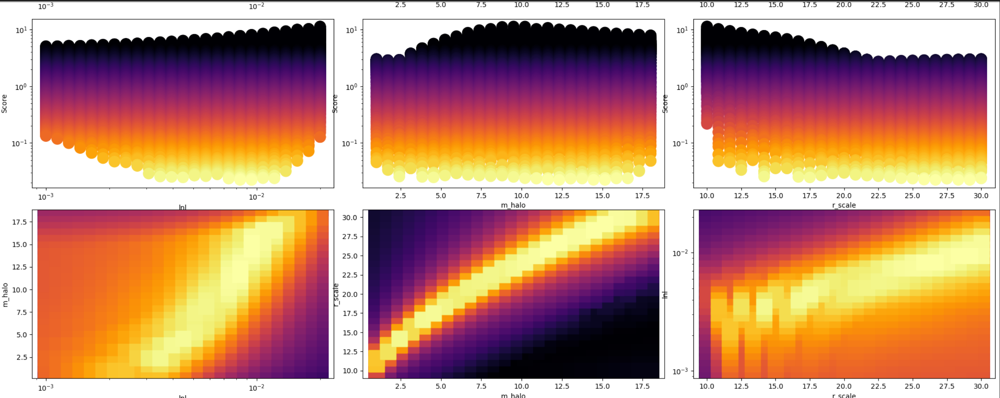

NameError: name 'size' is not defined

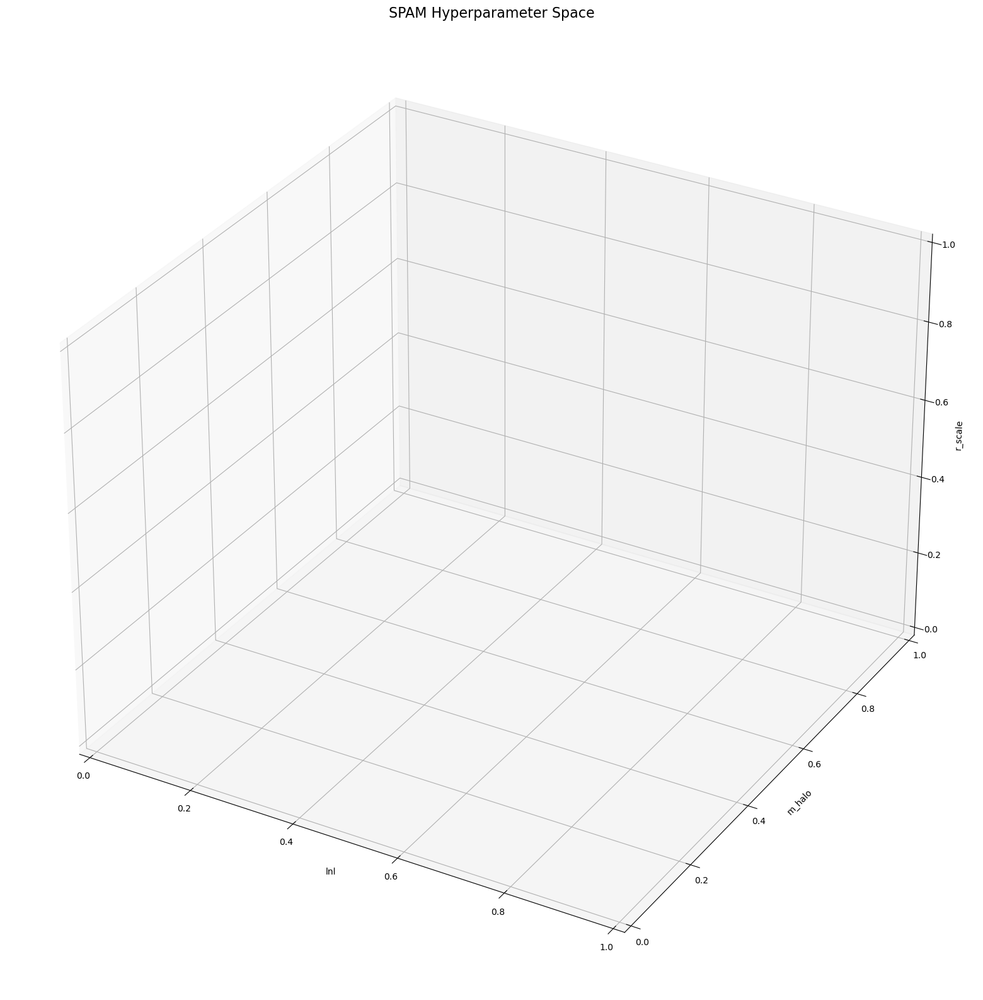

In [ ]:
if buildEnv:

    # Create interactive 3D scatter plot

    fig = plt.figure(figsize=(20,20))

    ax = fig.add_subplot(111, projection='3d')
    ax.set_title("SPAM Hyperparameter Space", fontsize=16)
    ax.set_xlabel(x_names[0])
    ax.set_ylabel(x_names[1])
    ax.set_zlabel(x_names[2])

    # Get x,y,z from grid
    x = [ gridseach_1['grid'][:,i] for i in range(3) ]
    y = gridseach_1['results']

    

    print( size )



In [ ]:
if buildEnv:

    # Get row with best score from df
    best_row = df.iloc[-1]
    best_score = best_row['score']
    print( best_score )
    print( best_row )

    # Get dict of row
    best_param = { k['name']:best_row[k['name']] for k in gridseach_1['space'] }
    
    def task_wrapper( sim_params ):

        orbit, _ = test_target.simulate_orbit( sim_params )
        src = test_target.weighted_avg_error_sq_over_by_time( orbit )
        _, pts = sim.basic_run( test_target.spam_ar, spam_setup_params = sim_params, npts1=4000, npts2 = 4000, heat1=0.1, heat2=0.1)
    
        return ( orbit, src, pts )    
    
    orbit, src, pts = task_wrapper( best_param )


Time:2025-02-17 15:51:30,879 - [2744772345.simulate_orbit] - INFO - Simulating SPAM Orbit
Time:2025-02-17 15:51:30,886 - [new_simulator.spam_orbit] - INFO - Running SPAM Simulation - Orbit Run
Time:2025-02-17 15:51:30,888 - [new_simulator.set_spam_parameters] - INFO - Setting SPAM Parameters: 


0.02417640570253769
lnl         0.004472
m_halo      4.500000
r_scale    17.500000
score       0.024176
Name: 119, dtype: float64


Time:2025-02-17 15:51:35,388 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time
Time:2025-02-17 15:51:35,827 - [new_simulator.basic_run] - INFO - Running SPAM Simulation - Basic Run
Time:2025-02-17 15:51:35,829 - [new_simulator.set_spam_parameters] - INFO - Setting SPAM Parameters: 
/home/mbo2d/galStuff/galaxyJSPAM/IllustrisTNG/tng_functions.py:787: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  h, xedges, yedges, image = ax.hist2d(hist_data[:, 0], hist_data[:, 1], bins=bins, range=[xlim, ylim], cmap=cmap)


<Figure size 640x480 with 0 Axes>

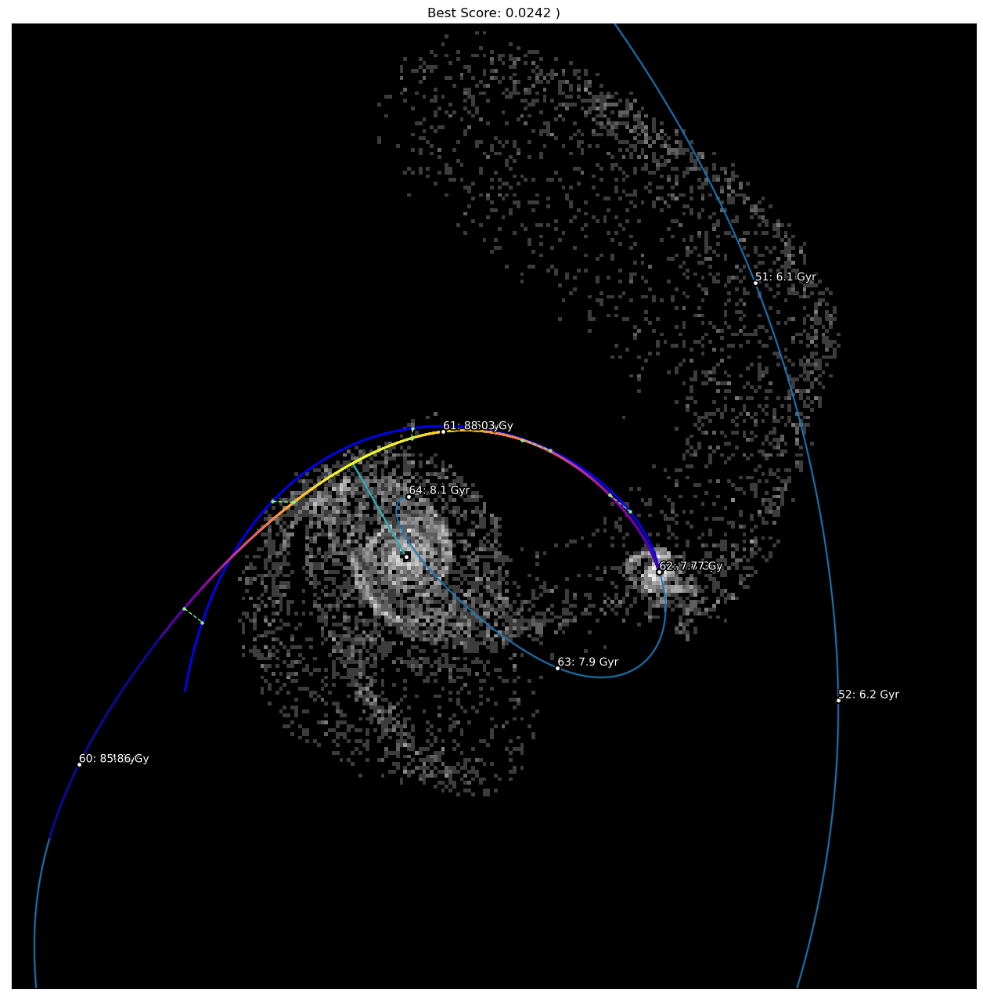

In [ ]:
if buildEnv:


    # Create single subplot
    plt.clf()
    fig, ax = plt.subplots(1,1, figsize=(16,16))
    
    plot_weighted_error_by_time( test_target, test_data, orbit, 
                                title=f"Best Score: {src:.4f} )", 
                                ext_ax = ax, 
                                # figsize=(20,14),
                                show_label=False, show_colorbar=False, weight_func=wf_2, 
                                overwrite_pts = pts )


In [ ]:
class POST_GRIDSEARCH_SCORING_ANALYSIS:    

    def __init__(self, tng_id, tail_range = [ 0.5, 1.0, 1.5, ], boundary_range = [0.01, 0.1, 0.5],
                 gridsearch_dir = '/home/mbo2d/galStuff/data/orbit_gridsearch_5_test/', 
                 results_dir = '/home/mbo2d/galStuff/results/' ):
                 
        logger.info("Creating Wrapper for Post Gridsearch Scoring: {}".format(tng_id))

        self.tng_target = DEV_SPAM_TNG_Tuner( tng_id, use_spline='natural' )

        # if weight tail is float, convert to list
        if isinstance(tail_range, float):
            tail_range = [ tail_range ]

        if isinstance(boundary_range, float):
            boundary_range = [ boundary_range ]
        
        # Loop through all possible combintations of weight tail and boundary value
        self.weight_functions = {}
        for t in tail_range:
            for b in boundary_range:
                name = f'tail:{t:.2f}_boundary:{b:.2f}'
                self.weight_functions[ name ] = { 'tail': t, 'boundary':b }
                self.weight_functions[ name ]['func'] = self.tng_target.gen_orbit_weights( boundary_value = b, scale_past = t )

        self.gridsearch_dir = gridsearch_dir
        self.gridsearch_log_loc = os.path.join( gridsearch_dir, 'all_log_v3.csv' )
        self.results_loc = os.path.join( results_dir, f'scores_v3_{tng_id}.csv' )

        # Load log file if it exists
        if os.path.exists(self.results_loc):
            self.log_df = pd.read_csv(self.results_loc)

        # Load log file if it exists
        elif os.path.exists(self.gridsearch_log_loc):
            self.log_df = pd.read_csv(self.gridsearch_log_loc)

        else:
            # Load and combine all the log files
            log_files = glob.glob( os.path.join(self.gridsearch_dir, '*.log') )
            self.log_df = pd.DataFrame()
            for f in log_files:
                tmp_df = pd.read_csv(f)
                self.log_df = pd.concat([self.log_df, tmp_df], ignore_index=True)

            # Rename columns
            self.log_df.rename(columns={'rscale':'r_scale', 'mhalo':'m_halo'}, inplace=True)

            # If unnamed in any columns, remove
            self.log_df = self.log_df.loc[:, ~self.log_df.columns.str.contains('^Unnamed')]

            # Log
            logger.debug("Collected Gridsearch Logs: {}".format(self.log_df.shape))

            # Search for r_scale value closest to default value of 10.0
            unique_r_scale = self.log_df['r_scale'].unique()
            closest_r_scale = min(unique_r_scale, key=lambda x:abs(x-10.0))
            logger.debug( f"Closest r_scale: {closest_r_scale}")

            # filter to only r_scale closest to 10.0
            self.log_df = self.log_df[ self.log_df['r_scale'] == closest_r_scale ]

            # Log
            logger.debug("Filtered Gridsearch Logs: {}".format(self.log_df.shape))

            # Save
            self.log_df.to_csv( self.gridsearch_log_loc )
            
    def score_orbit_v3(self, spam_orbit ):
        logger.info(f"Many scores for orbit")
        logger.debug( f"Spam_orbit: {spam_orbit.shape}")
        logger.debug( f"Scores: {len(self.weight_functions)}")

        scores_dict = {}

        for weight_name in self.weight_functions:
            logger.debug(f"Scoring: {weight_name}")
            scores_dict[f"pos_{weight_name}"] = self.tng_target.weighted_avg_error_sq_over_by_pos( spam_orbit, weight_func = self.weight_functions[weight_name]['func'] )
            scores_dict[f"time_{weight_name}"] = self.tng_target.weighted_avg_error_sq_over_by_time( spam_orbit, weight_func = self.weight_functions[weight_name]['func'] )

        logger.debug( f"Scores: {scores_dict}")

        # return a dict to name scores
        return scores_dict
            
    def score_orbit_v2(self, spam_orbit, weight=0.5 ):
        logger.info(f"Scoring Orbit by Time & Pos")
        logger.debug( f"Spam_oribts: {spam_orbit.shape}")
        logger.debug( f"weight: {weight:.2f}")

        
        score_pos = self.tng_target.weighted_avg_error_sq_over_by_pos( spam_orbit, )
        score_time = self.tng_target.weighted_avg_error_sq_over_by_time( spam_orbit, )
        score_avg = weight*score_time + (1-weight)*score_pos

        logger.debug( f"Score Time: {score_time:.5f} + Score Pos: {score_pos:.5f}")
        logger.debug( f"Score Eq: {weight*100:.0f}% Time + {(1-weight)*100:.0f}% Pos: {score_avg:.5f}")

        # return a dict to name scores
        return { 'score_pos': score_pos, 'score_time': score_time, 'score_avg': score_avg }

    def score_orbit_file( self, orbit_loc ):
        logger.info(f"Scoring Orbit: {orbit_loc}")
        # Verify orbit file exists
        if not os.path.exists(orbit_loc):
            logger.error(f"Orbit File Not Found: {orbit_loc}")
            raise FileNotFoundError(f"Orbit File Not Found: {orbit_loc}")

        # Load  npz orbit file
        spam_file = np.load(orbit_loc)
        logger.debug( f"Orbit Type Loaded: {type(spam_file)}")

        spam_orbit = spam_file['arr_0']
        logger.debug( f"Orbit Shape: {spam_orbit.shape}")

        scores = self.score_orbit_v3( spam_orbit )
        logger.info( f"Scores: {scores}")

        return scores

    def gen_orbit( self, params ):
        logger.info(f"Generating Orbit: {params}")
        # Verify orbit file exists
        if not os.path.exists(params):
            logger.error(f"Orbit File Not Found: {params}")
            raise FileNotFoundError(f"Orbit File Not Found: {params}")

        # Load  npz orbit file
        spam_file = np.load(params)
        logger.debug( f"Orbit Type Loaded: {type(spam_file)}")

        spam_orbit = spam_file['arr_0']
        logger.debug( f"Orbit Shape: {spam_orbit.shape}")

        return spam_orbit

# Loops through saved orbits to generate scores
if buildEnv and True:

    logger.setLevel( logging.DEBUG )
    gs_wrapper = POST_GRIDSEARCH_SCORING_ANALYSIS( p1, tail_range = [0.5, 1.0], boundary_range = 0.01 )

    # Scores a sample of orbits
    logger.setLevel( logging.INFO )

    sample_df = gs_wrapper.log_df.sample(5)

    for i, row in sample_df.iterrows():
        logger.debug( f"Row {i}: {row}" )
        scores = gs_wrapper.score_orbit_file( row['orbit_loc'] )
        print( f'Scores: {scores}s')



Time:2025-02-12 16:44:08,293 - [3478013031.__init__] - INFO - Creating Wrapper for Post Gridsearch Scoring: 62000000190717
Time:2025-02-12 16:44:08,294 - [convert_tng_to_spam.__init__] - INFO - Initializing TNG Target Class...
Time:2025-02-12 16:44:08,294 - [convert_tng_to_spam.__init__] - DEBUG - TNG Primary ID: 62000000190717
Time:2025-02-12 16:44:08,295 - [convert_tng_to_spam.__init__] - DEBUG - TNG Dynamics Path: /home/mbo2d/galStuff/galaxyJSPAM/IllustrisTNG/tng-targets/moi-4-targets.pkl
Time:2025-02-12 16:44:08,295 - [convert_tng_to_spam.__init__] - DEBUG - Spline Type: natural
Time:2025-02-12 16:44:08,496 - [convert_tng_to_spam.extractTargetData] - DEBUG - Extracting target data...
Time:2025-02-12 16:44:08,509 - [convert_tng_to_spam._load_tng_target_particles] - DEBUG - Loading TNG Target Particles...
Time:2025-02-12 16:44:08,510 - [convert_tng_to_spam.get_tng_target_pts] - DEBUG - Getting TNG target pts...: 62000000190717
Time:2025-02-12 16:44:09,089 - [convert_tng_to_spam._gene

Scores: {'pos_tail:0.50_boundary:0.01': 0.3157803931383805, 'time_tail:0.50_boundary:0.01': 5.238106661965991, 'pos_tail:1.00_boundary:0.01': 0.443131647495323, 'time_tail:1.00_boundary:0.01': 4.642383914518515}s


Time:2025-02-12 16:44:10,183 - [3478013031.score_orbit_file] - INFO - Scores: {'pos_tail:0.50_boundary:0.01': 0.025677710810494362, 'time_tail:0.50_boundary:0.01': 2.5179518640538916, 'pos_tail:1.00_boundary:0.01': 0.08038955212230132, 'time_tail:1.00_boundary:0.01': 2.0400997118174486}
Time:2025-02-12 16:44:10,185 - [3478013031.score_orbit_file] - INFO - Scoring Orbit: /home/mbo2d/galStuff/data/orbit_gridsearch_5_test/17_orbit_530_1.npz
Time:2025-02-12 16:44:10,186 - [3478013031.score_orbit_v3] - INFO - Many scores for orbit
Time:2025-02-12 16:44:10,186 - [3358375679.weighted_avg_error_sq_over_by_pos] - INFO - Score Function for Orbit Similarity by Position
Time:2025-02-12 16:44:10,200 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time
Time:2025-02-12 16:44:10,313 - [3358375679.weighted_avg_error_sq_over_by_pos] - INFO - Score Function for Orbit Similarity by Position
Time:2025-02-12 16:44:10,327 - [3760093212.weighted_avg_error_sq_o

Scores: {'pos_tail:0.50_boundary:0.01': 0.025677710810494362, 'time_tail:0.50_boundary:0.01': 2.5179518640538916, 'pos_tail:1.00_boundary:0.01': 0.08038955212230132, 'time_tail:1.00_boundary:0.01': 2.0400997118174486}s


Time:2025-02-12 16:44:10,439 - [3478013031.score_orbit_file] - INFO - Scores: {'pos_tail:0.50_boundary:0.01': 2.1943867386465064, 'time_tail:0.50_boundary:0.01': 2.308979955837288, 'pos_tail:1.00_boundary:0.01': 4.071519631346544, 'time_tail:1.00_boundary:0.01': 4.184618253223154}
Time:2025-02-12 16:44:10,440 - [3478013031.score_orbit_file] - INFO - Scoring Orbit: /home/mbo2d/galStuff/data/orbit_gridsearch_5_test/19_orbit_173_1.npz
Time:2025-02-12 16:44:10,442 - [3478013031.score_orbit_v3] - INFO - Many scores for orbit
Time:2025-02-12 16:44:10,442 - [3358375679.weighted_avg_error_sq_over_by_pos] - INFO - Score Function for Orbit Similarity by Position
Time:2025-02-12 16:44:10,465 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time
Time:2025-02-12 16:44:10,578 - [3358375679.weighted_avg_error_sq_over_by_pos] - INFO - Score Function for Orbit Similarity by Position
Time:2025-02-12 16:44:10,601 - [3760093212.weighted_avg_error_sq_over_by

Scores: {'pos_tail:0.50_boundary:0.01': 2.1943867386465064, 'time_tail:0.50_boundary:0.01': 2.308979955837288, 'pos_tail:1.00_boundary:0.01': 4.071519631346544, 'time_tail:1.00_boundary:0.01': 4.184618253223154}s


Time:2025-02-12 16:44:10,714 - [3478013031.score_orbit_file] - INFO - Scores: {'pos_tail:0.50_boundary:0.01': 0.1690457021956, 'time_tail:0.50_boundary:0.01': 7.000367388364223, 'pos_tail:1.00_boundary:0.01': 0.29854350563902643, 'time_tail:1.00_boundary:0.01': 6.363830185397694}
Time:2025-02-12 16:44:10,715 - [3478013031.score_orbit_file] - INFO - Scoring Orbit: /home/mbo2d/galStuff/data/orbit_gridsearch_5_test/7_orbit_296_1.npz
Time:2025-02-12 16:44:10,716 - [3478013031.score_orbit_v3] - INFO - Many scores for orbit
Time:2025-02-12 16:44:10,717 - [3358375679.weighted_avg_error_sq_over_by_pos] - INFO - Score Function for Orbit Similarity by Position
Time:2025-02-12 16:44:10,746 - [3760093212.weighted_avg_error_sq_over_by_time] - INFO - Score Function for Orbit Similarity by Time
Time:2025-02-12 16:44:10,876 - [3358375679.weighted_avg_error_sq_over_by_pos] - INFO - Score Function for Orbit Similarity by Position
Time:2025-02-12 16:44:10,904 - [3760093212.weighted_avg_error_sq_over_by_t

Scores: {'pos_tail:0.50_boundary:0.01': 0.1690457021956, 'time_tail:0.50_boundary:0.01': 7.000367388364223, 'pos_tail:1.00_boundary:0.01': 0.29854350563902643, 'time_tail:1.00_boundary:0.01': 6.363830185397694}s


Time:2025-02-12 16:44:11,035 - [3478013031.score_orbit_file] - INFO - Scores: {'pos_tail:0.50_boundary:0.01': 0.040555664640620964, 'time_tail:0.50_boundary:0.01': 2.411824005309689, 'pos_tail:1.00_boundary:0.01': 0.07477803566185565, 'time_tail:1.00_boundary:0.01': 3.0781891951447227}


Scores: {'pos_tail:0.50_boundary:0.01': 0.040555664640620964, 'time_tail:0.50_boundary:0.01': 2.411824005309689, 'pos_tail:1.00_boundary:0.01': 0.07477803566185565, 'time_tail:1.00_boundary:0.01': 3.0781891951447227}s


In [ ]:
def score_gridsearch( self, sample = -1, save_every_n = 1500 ):

    # If score columns not in log_df, add them
    score_col = [ f"{key}_{name}" for key in ['pos', 'time'] for name in self.weight_functions ]
    for col in score_col:
        if col not in self.log_df.columns:
            self.log_df[col] = np.nan

    # Get idx of rows that need a score
    score_idx = self.log_df[ self.log_df[score_col].isna().any(axis=1) ].index

    # Get index of random samples if sample is not None
    if sample != -1:
        score_idx = np.random.choice( self.log_df.index, sample, replace=False ) 
        logger.debug( f"Sample IDX: {score_idx}" )

        if type( score_idx ) == np.int64:
            score_idx = [score_idx]
    else:
        score_idx = self.log_df.index
    
    n = len(score_idx)
    logger.warning(f"Beginning Gridsearch Scoring for: {n} Orbits")

    # Setup Queue Manager for parallel processing of function
    task_manager = qm.Queue_Manager( self.score_orbit_file )

    # Split score_ids=x into chunks of size save_every_n or smaller
    score_idx_blocks = np.array_split( score_idx, np.ceil(n/save_every_n) )
    
    # Loop through chunks of orbit_locs
    for i, idx_block in enumerate(score_idx_blocks):
        # Print size of chunk 
        logger.debug( f"Scoring Block {i+1}/{len(score_idx_blocks)}: {len(idx_block)} Orbits")

        # Get list of orbit_locs from block
        orbit_locs = self.log_df.loc[idx_block, 'orbit_loc'].tolist()

        # Give queue of inputs to process in parallel
        results = task_manager.evaluate_tasks( orbit_locs, )

        # Print first row to log if process is working
        logger.info( f"Scored: {idx_block[0]} - {results[0]} - {orbit_locs[0]}" )

        # Add results to log_df
        for j, idx in enumerate(idx_block):
            
            # Iterate over results to place score with column by name
            for key in results[j]:
                self.log_df.loc[idx, key] = results[j][key]
            
                
        # Save log_df to csv
        logger.warning(f"Saving Orbits Results: {len(idx_block)}")
        logger.warning( f"Orbits with Scores: {int(len( self.log_df * len(score_col)) - self.log_df[score_col].isna().sum().sum()/ len(score_col))}" )
        self.log_df.to_csv( self.results_loc, index=False )
    
    # Log number of orbits without score
    logger.warning( f"Orbits without Scores: {int(self.log_df[score_col].isna().sum().sum()/ len(score_col))}" )
    # log total orbits:
    logger.warning( f"Orbits Count: {len(self.log_df)}" )

    # Close Queue Manager
    task_manager.terminate_workers()
    del task_manager
    

# add function to class
setattr( POST_GRIDSEARCH_SCORING_ANALYSIS, 'score_gridsearch', score_gridsearch )

# Analyze results
if buildEnv and False:

    logger.setLevel( logging.WARNING)

    gs_wrapper = POST_GRIDSEARCH_SCORING_ANALYSIS( p1, )

    # logger.setLevel( logging.DEBUG)
    gs_wrapper.score_gridsearch(  sample = 25, save_every_n = 20 )
    gs_wrapper.score_gridsearch( )

    # # Load results from csv
    gs_df_3 = pd.read_csv( gs_wrapper.results_loc )



In [ ]:
# Let's create a wrapper to do the entire gridsearch from command line
def cmd_func_test_gridsearch( script_args, tng_id = None, sample_n=-1, every_n = 1000,
                              gridsearch_dir = '/home/mbo2d/galStuff/data/orbit_gridsearch_5_test/', 
                              results_dir = '/home/mbo2d/galStuff/results/' ):
    """
    This function will run the entire gridsearch process from command line
    """

    # See if misc inputs exis
    tng_id = script_args.target_id if script_args.target_id else tng_id
    gridsearch_dir = script_args.input if script_args.input else gridsearch_dir
    results_dir = script_args.input2 if script_args.input2 else results_dir
    sample_n =  int( script_args.input3 if script_args.input3 else sample_n )
    save_n = int( script_args.input4 if script_args.input4 else every_n )

    # print all the inputs and their types
    logger.warning( f"tng_id: {type(tng_id)} - {tng_id}" )
    logger.warning( f"gridsearch_dir: {type(gridsearch_dir)} - {gridsearch_dir}" )
    logger.warning( f"results_dir: {type(results_dir)} - {results_dir}" )
    logger.warning( f"sample_n: {type(sample_n)} - {sample_n}" )
    logger.warning( f"save_n: {type(save_n)} - {save_n}" )

    # Create wrapper object
    gs_wrapper = score_post_gridsearch_wrapper( tng_id, gridsearch_dir = gridsearch_dir, results_dir = results_dir )

    # Run gridsearch
    gs_wrapper.score_gridsearch( sample=sample_n, save_every_n=save_n )

if buildEnv and False:
    test_cmd_line = f"python3 spam_tuner_tng_targets.py --log-level WARNING --target_id {p1} --function test_gridsearch --input3 100 --input4 60"
    print(test_cmd_line)

    logger.setLevel( logging.WARNING )

    # Create new test arguments
    test_args_handler = gu.ArgHandler()
    test_args = test_args_handler.parse_args_from_string( test_cmd_line )
    print( test_args )

    cmd_func_test_gridsearch( test_args, sample_n = 50, every_n=20 )

if script_args.function == 'test_gridsearch':
    cmd_func_test_gridsearch( script_args )  

# View Gridsearch results

I performed a gridsearch of 3 variables a while back.  This was to load those and perform the score function on them

  Variable  Correlation  Linear Coefficient  Permutation Importance  \
0      lnl     0.124080            6.158240            3.098248e-02   
1  r_scale    -0.000010           -0.000006           -2.694142e-08   
2   m_halo     0.155148            0.165349            4.750830e-02   

   R² Drop When Removed  ANOVA p-value  
0          1.539527e-02            0.0  
1          7.788215e-11            0.0  
2          2.407047e-02            0.0  


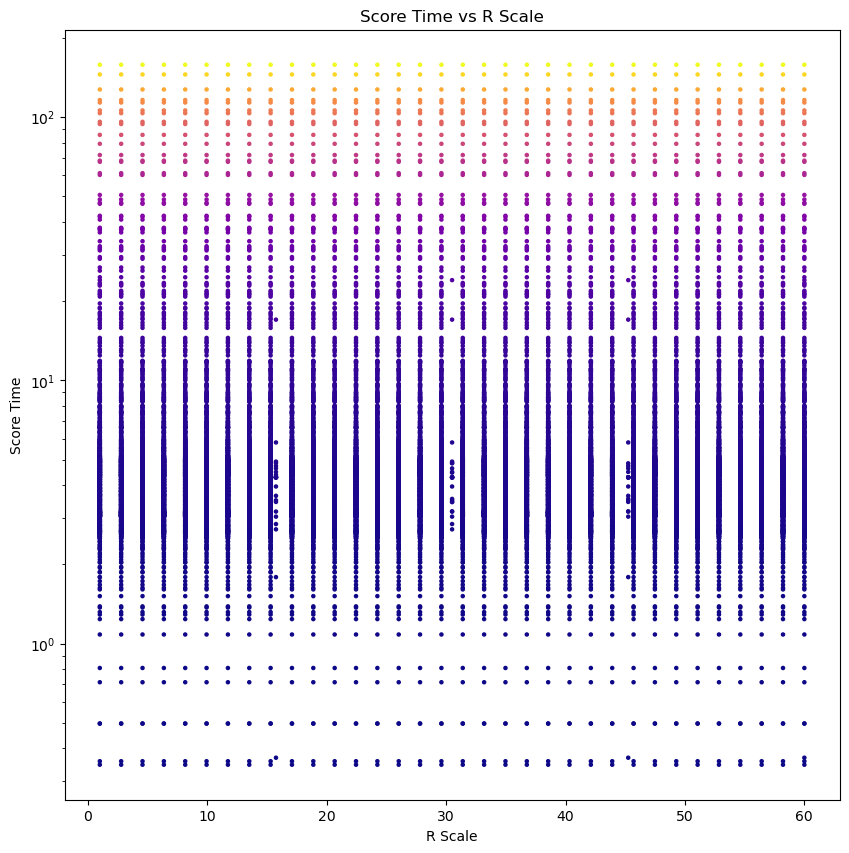

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.inspection import permutation_importance
from sklearn.metrics import r2_score
from scipy.stats import f_oneway

def analyze_variable_impact(df, target_col):
    """
    Analyzes the impact of each variable in a dataset on the target column.
    
    Parameters:
        df (pd.DataFrame): DataFrame containing independent variables and a target variable.
        target_col (str): Name of the target column.

    Returns:
        pd.DataFrame: Summary of results for each variable.
    """
    results = []
    X = df.drop(columns=[target_col])
    y = df[target_col]

    # Correlation with target
    correlations = df.corr()[target_col]

    # Linear Regression
    model = LinearRegression()
    model.fit(X, y)
    coefs = model.coef_

    # Permutation Importance
    perm_importance = permutation_importance(model, X, y, scoring='r2', n_repeats=10, random_state=42)
    
    # Leave-One-Out R² Score
    r2_full = r2_score(y, model.predict(X))
    r2_drops = {}
    
    for var in X.columns:
        reduced_X = X.drop(columns=[var])
        model_reduced = LinearRegression().fit(reduced_X, y)
        r2_drops[var] = r2_score(y, model_reduced.predict(reduced_X))

    # ANOVA Test
    f_stat, p_value = f_oneway(*[df[var] for var in X.columns])
    
    # Collect results
    for i, var in enumerate(X.columns):
        results.append({
            "Variable": var,
            "Correlation": correlations[var],
            "Linear Coefficient": coefs[i],
            "Permutation Importance": perm_importance.importances_mean[i],
            "R² Drop When Removed": r2_full - r2_drops[var],
            "ANOVA p-value": p_value
        })

    # Convert to DataFrame and display
    results_df = pd.DataFrame(results)
    # import ace_tools as tools
    # tools.display_dataframe_to_user(name="Variable Impact Analysis", dataframe=results_df)
    
    return results_df

if buildEnv:
    # Example Usage:
    # df = pd.DataFrame({"var1": x1, "var2": x2, "var3": x3, "score": y})
    gs_df = pd.read_csv( gs_wrapper.results_loc.replace('v3', 'v2') )
    test_df = gs_df[['lnl', 'r_scale', 'm_halo', 'score_time']]
    results_df = analyze_variable_impact(test_df, "score_time")

    print( results_df )

    # Do scatter plot of score_time vs rscale
    fig, ax = plt.subplots(1,1, figsize=(10,10))
    
    # Create scatter heat plot
    sc = ax.scatter( gs_df['r_scale'], gs_df['score_time'], c=gs_df['score_time'], cmap='plasma', s=5 )

    ax.set_xlabel('R Scale')
    ax.set_ylabel('Score Time')
    ax.set_title('Score Time vs R Scale')

    # Scale y axis by log
    ax.set_yscale('log')


### R_Scale:

Now, I had assumed the r_scale should change the size of the disk and dark matter halo.  If they did change, then the dynamical friction and pull of gravity based on mass diftribution should change.  But it doesn't....  Therefore r_scale does not do what I think it does.  For now I'm going to ignore it, but I should probably comfirm that later. 

Best Time: 
score_time     0.347056
lnl            0.005337
r_scale       18.878788
m_halo         1.000000
Name: 3821, dtype: float64

Best Pos: 
score_pos     0.008804
lnl           0.123285
r_scale      27.818182
m_halo       19.909091
Name: 37386, dtype: float64



<Figure size 640x480 with 0 Axes>

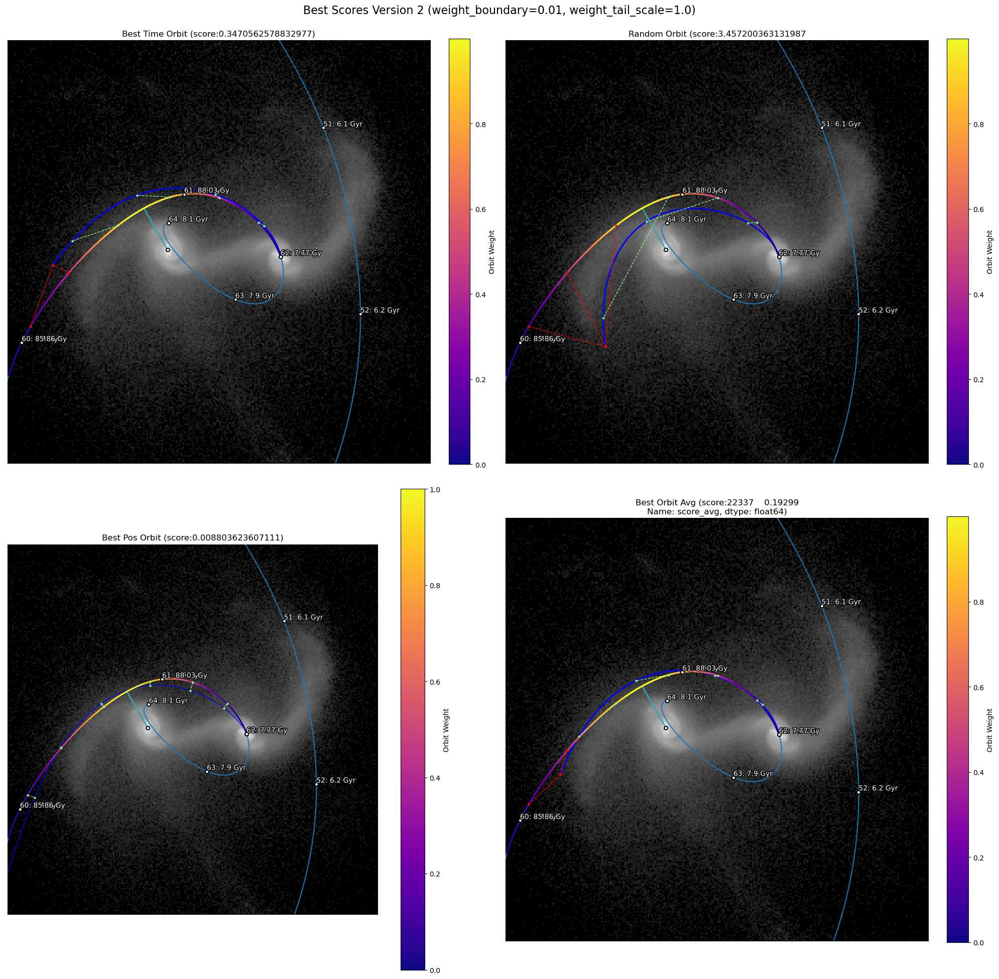

In [ ]:
if buildEnv:

    # grab the best n orbits by time
    grab_n = 10
    best_time = gs_df.sort_values('score_time').head(grab_n)

    # grab the best n orbits by pos
    best_pos = gs_df.sort_values('score_pos').head(grab_n)

    # grab orbits for best pos
    best_pos_orbits = [ np.load( f )['arr_0'] for f in best_pos['orbit_loc'] ]

    # Load orbit values of best orbits
    best_time_orbits = [ np.load( f )['arr_0'] for f in best_time['orbit_loc'] ]

    # for i, orbit in enumerate(best_time_orbits):

    # create a large plot
    plt.clf()
    fig, ax = plt.subplots(2,2, figsize=(20,20))

    # Big title for all plots
    fig.suptitle("Best Scores Version 2 (weight_boundary=0.01, weight_tail_scale=1.0)", fontsize=16)
    
    fig.tight_layout()

    # Grab 4 random rows
    random_rows = gs_df.sample(4)

    # load orbits for random rows
    random_orbits = [ np.load( f )['arr_0'] for f in random_rows['orbit_loc'] ]


    plot_weighted_error_by_time( gs_wrapper.tng_target, None, best_time_orbits[0], title=f"Best Time Orbit (score:{best_time.iloc[0]['score_time']})", show_label=False, ext_ax=ax[0,0] )
    plot_weighted_error_by_time( gs_wrapper.tng_target, None, random_orbits[0], title=f"Random Orbit (score:{random_rows.iloc[0]['score_time']}", show_label=False, ext_ax=ax[0,1] )

    plot_weighted_error_by_pos( gs_wrapper.tng_target, None, best_pos_orbits[0], title=f"Best Pos Orbit (score:{best_pos.iloc[0]['score_pos']})", show_label=False, ext_ax=ax[1,0] )

    fig.tight_layout()
    # Get best orbit by avg score
    best_avg = gs_df.sort_values('score_avg').head(1)
    best_avg_orbit = np.load( best_avg['orbit_loc'].values[0] )['arr_0']
    
    plot_weighted_error_by_time( gs_wrapper.tng_target, None, best_avg_orbit, title=f"Best Orbit Avg (score:{best_avg['score_avg']})", show_label=False, ext_ax=ax[1,1] )


    print(f"Best Time: \n{best_time[['score_time', 'lnl', 'r_scale', 'm_halo']].iloc[0]}\n")
    print(f"Best Pos: \n{best_pos[['score_pos', 'lnl', 'r_scale', 'm_halo']].iloc[0]}\n")


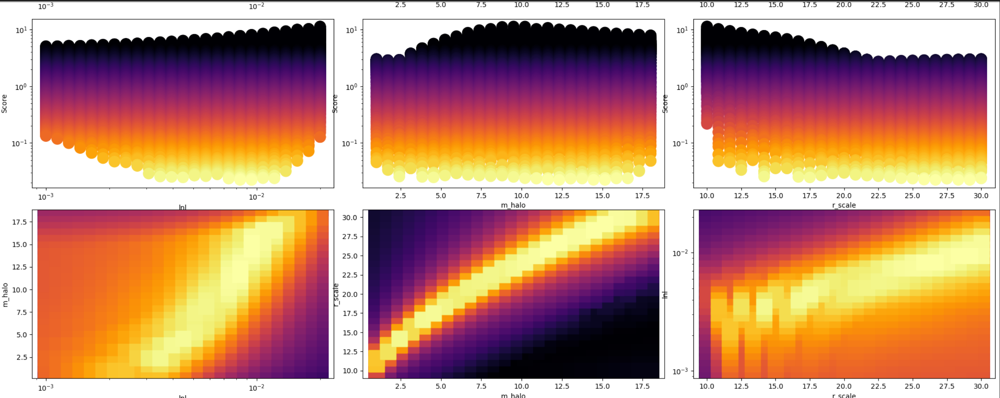

## V2 Score Analysis
All the following assume weights with boundary_value = 0.01 and inbound_weight_scale = 1.0.
### Score_Pos
The best result for score_pos appears just as I expected.  Good.
### Score_Time
I'm concerned about the score_time's best.  It almost appears to be "pulling" the orbit to be faster, in orbit to minimize the inbound tail.  This is a shame because I do not have control over when the SPAM runs ends (yet).  I suspect shortening the inbound tail using the inbound_weight_scale should fix this.

RERUN RESULTS!

Version 3 Scores (1156, 26)
Score Col: (18)
Time Col (9): ['time_tail:0.50_boundary:0.01', 'time_tail:0.50_boundary:0.10', 'time_tail:0.50_boundary:0.50', 'time_tail:1.00_boundary:0.01', 'time_tail:1.00_boundary:0.10', 'time_tail:1.00_boundary:0.50', 'time_tail:1.50_boundary:0.01', 'time_tail:1.50_boundary:0.10', 'time_tail:1.50_boundary:0.50']
Pos Col (9): ['pos_tail:0.50_boundary:0.01', 'pos_tail:0.50_boundary:0.10', 'pos_tail:0.50_boundary:0.50', 'pos_tail:1.00_boundary:0.01', 'pos_tail:1.00_boundary:0.10', 'pos_tail:1.00_boundary:0.50', 'pos_tail:1.50_boundary:0.01', 'pos_tail:1.50_boundary:0.10', 'pos_tail:1.50_boundary:0.50']
Best Scores: (26, 18)
                   68              267             606             641   \
lnl            0.018738        0.006579            0.01        0.123285   
r_scale        9.939394        9.939394        9.939394        9.939394   
m_halo        36.454545        2.181818        3.363636       19.909091   
p_id     62000000190717  6200000019071

<Figure size 640x480 with 0 Axes>

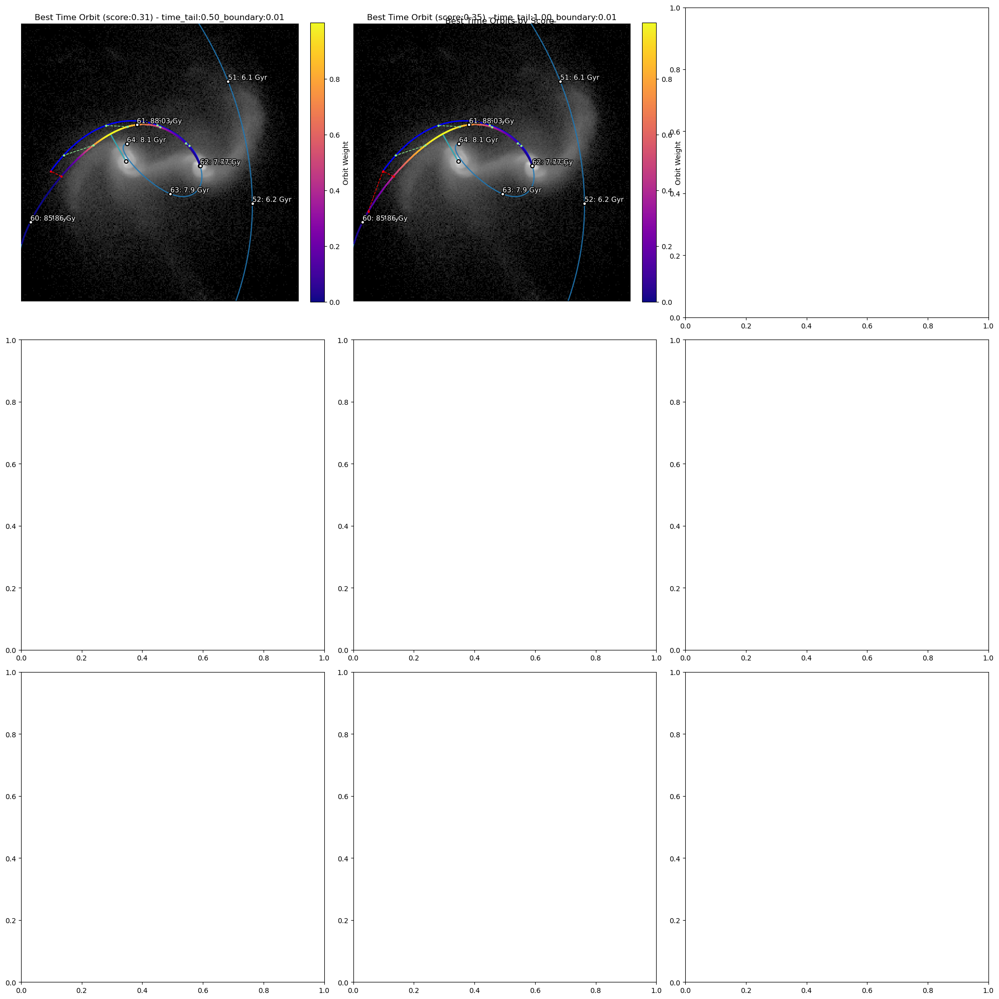

In [ ]:
if buildEnv:
    gs_df_3 = pd.read_csv( gs_wrapper.results_loc )
    print( "Version 3 Scores", gs_df_3.shape )
    # print( gs_df_3.head())

    # Loop through columns, print how many nan values
    # for col in gs_df_3.columns:
    #     print( f"{col}: {gs_df_3[col].isna().sum()}")

    # Remove unnamed columns and resave to csv
    # gs_df_3 = gs_df_3.loc[:, ~gs_df_3.columns.str.contains('^Unnamed')]
    # print( gs_df_3.head())

    # Remove any "pos_tail_{float}" columns that don't have boundary in name
    for col in gs_df_3.columns:
        if '_tail_' in col:
            gs_df_3.drop(columns=[col], inplace=True)
    
    # save to scv
    gs_df_3.to_csv( gs_wrapper.results_loc, index=False )
    

    # Loop through columns, print how many nan values
    # for col in gs_df_3.columns:
    #     print( f"{col}: {gs_df_3[col].isna().sum()}")

    # # Let's see how many are scores
    score_col = [ col for col in gs_df_3.columns if 'boundary' in col and ('time' in col or 'pos' in col) ]
    print( f"Score Col: ({len(score_col)})")

    # # Get just those with time
    time_col = [ col for col in score_col if 'time' in col ]
    pos_col = [ col for col in score_col if 'pos' in col ]
    print( f"Time Col ({len(time_col)}): {time_col}")
    print( f"Pos Col ({len(pos_col)}): {pos_col}")

    best = []

    # # Print best score in each col and they're inputs (index, lnl, m_halo )
    for col in score_col:
        best_row = gs_df_3.sort_values(col).head(1).iloc[0]
        best.append( best_row )
    
    best_df = pd.concat(best, axis=1)
    print( f"Best Scores: {best_df.shape}")
    print( best_df.head())


    # create a 9x9 subplot
    plt.clf()
    fig, ax = plt.subplots(3,3, figsize=(20,20))
    fig.tight_layout()

    fig.suptitle("Best Time Orbits by Score")

    for i, weight_func_name in enumerate(gs_wrapper.weight_functions):
        row = i // 3
        col = i % 3

        # grab top row for 1st time col

        col_name = f"time_{weight_func_name}"
        weight_func = gs_wrapper.weight_functions[weight_func_name]['func']

        # grab top row for 1st time col
        best_row = gs_df_3.sort_values(col_name).head(1).iloc[0]

        # print best scores
        print( f"Best Time Orbit ({col_name}): {gs_df_3.sort_values(col_name).head(5)[col_name].values}")

        # Load orbit for best row
        best_orbit = np.load( best_row['orbit_loc'] )['arr_0']

        plot_weighted_error_by_time( gs_wrapper.tng_target, None, best_orbit, weight_func=weight_func,
                                    title=f"Best Time Orbit (score:{best_row[col_name]:.2f}) - {col_name}", 
                                    show_label=False, ext_ax=ax[row,col] )


In [ ]:

if buildEnv:
    # grab the best n orbits by pos
    best_pos = gs_df.sort_values('score_pos').head(grab_n)

    # grab the best n orbits by avg
    best_avg = gs_df.sort_values('score_avg').head(grab_n)

In [ ]:
class orbit_generator_class:

    def __init__(self, p_id, x_dict, save_dir = None, save_orbit = False):

        LOGGER.info("Setting up Orbit Generator...")
        self.p_id = p_id

        # Get MPI rank of myself
        rank = MPI.COMM_WORLD.Get_rank()

        # Save x_dict to keep input names for later function call
        if x_dict is not None:
            self.x_dict = x_dict
        else:
            LOGGER.error("x_dict cannot be None")
            raise ValueError("x_dict cannot be None")
        
        # If save_orbit is True, ensure there's a save dir
        if save_orbit and save_dir is None:
            LOGGER.error("save_dir must be set if save_orbit is True")
            raise ValueError("save_dir must be set if save_orbit is True")

        # If saving files, ensure the directory exists
        self.save_dir = None
        self.c = 0
        if save_dir is not None:
            self.save_dir = save_dir

            # create dir if needed
            if not os.path.exists( self.save_dir ):
                os.makedirs( self.save_dir )

            # Creat a log file that should be unique to me
            self.log_file = os.path.join( self.save_dir, f'{rank}.log' )

            # Create generic zip orbit path for later use
            self.orbit_loc = os.path.join( self.save_dir, f'{rank}_orbit_%d_%d.npz' )

            self.save_orbit = save_orbit

        # Create dataframe to hold info
        self.log_df = pd.DataFrame()

        # Setup default variables
        self.t_row, self.t_df, self.path = get_tng_target_orbit( self.p_id )

        # Create SPAM arrays for the target
        # print("Past Snap: ", self.path['before_closest_approach_snap'])
        self.tng_ar_1 = standardize_tng_parameters_v1( self.t_row )
        self.tng_ar_2 = standardize_tng_parameters_v2( self.t_df, self.t_row['snap'], self.path['before_closest_approach_snap'] )

        self.spam_ar_1 = convert_units_tng_to_spam( self.tng_ar_1 )
        self.spam_ar_2 = convert_units_tng_to_spam( self.tng_ar_2 )

        # print( f"SPAM AR 1: {self.spam_ar_1}")
        # print( f"SPAM AR 2: {self.spam_ar_2}")

    def create_orbit(self, in_setup_ar = None, in_setup_dict = None):

        if in_setup_dict is None and in_setup_ar is None:
            LOGGER.error("in_setup_dict or in_setup_ar must be set")
            raise ValueError("in_setup_dict or in_setup_ar must be set")

        if in_setup_dict is None:
            in_setup_dict = {}
            for i, x in enumerate(self.x_dict):
                in_setup_dict[x] = in_setup_ar[i]

        spam_orbit = spam_orbit_wrapper_squared( self.spam_ar_2, spam_setup_var=in_setup_dict, current_time=self.t_row['times_su'] )
        return spam_orbit

    def create_orbit_log_wrapper(self, in_setup_ar):

        # Loop through x_range and save name to in_ar variables
        in_setup_dict = {}
        for i, x in enumerate(self.x_dict):
            in_setup_dict[x] = in_setup_ar[i]

        LOGGER.debug("Running SPAM Simulation... %s", str(in_setup_dict))
        # spam_orbit_1 = spam_orbit_wrapper_squared( self.spam_ar_1, spam_setup_var=in_var, current_time=self.t_row['times_su'] )
        # LOGGER.debug( f"SPAM Orbit Shape: {spam_orbit_1.shape}" )
        spam_orbit_2 = spam_orbit_wrapper_squared( self.spam_ar_2, spam_setup_var=in_setup_dict, current_time=self.t_row['times_su'] )
        LOGGER.debug( f"SPAM Orbit Shape: {spam_orbit_2.shape}" )

        # Copy in_var and add keys and values to it
        in_var['p_id'] = self.p_id
        # in_var['orbit_n_1'] = spam_orbit_1.shape[0]
        in_var['orbit_n_2'] = spam_orbit_2.shape[0]
        in_var['c'] = self.c

        # Save orbit to a file
        if self.save_dir is not None:
            # tmp_save_loc_1 = self.orbit_loc % (self.c, 0)
            tmp_save_loc_2 = self.orbit_loc % (self.c, 1)
            
            # in_var['orbit_loc_1'] = tmp_save_loc_1
            in_var['orbit_loc_2'] = tmp_save_loc_2

            # np.savez( tmp_save_loc_1, spam_orbit_1 )
            np.savez( tmp_save_loc_2, spam_orbit_2 )

            LOGGER.debug( f"Saved Orbit to: {tmp_save_loc_1}" )

        # Add dict to dataframe
        self.log_df = pd.concat([self.log_df, pd.DataFrame([in_var])], ignore_index=True)

        # Save the dataframe
        if self.save_dir is not None: self.log_df.to_csv( self.log_file, index=False )
        
        self.c += 1 

        return spam_orbit_2
    

    def create_score_log_wrapper(self, in_setup_ar = None, in_setup_dict = None):

        if in_setup_dict is None and in_setup_ar is None:
            LOGGER.error("in_setup_dict or in_setup_ar must be set")
            raise ValueError("in_setup_dict or in_setup_ar must be set")
        
        if in_setup_dict is None:
            in_setup_dict = {}
            for i, x in enumerate(self.x_dict):
                in_setup_dict[x] = in_setup_ar[i]
        
        LOGGER.debug("Running SPAM Simulation... %s", str(in_setup_dict))
        spam_orbit = spam_orbit_wrapper_squared( self.spam_ar_2, spam_setup_var=in_setup_dict, current_time=self.t_row['times_su'] )
        LOGGER.debug( f"SPAM Orbit Shape: {spam_orbit.shape}" )
        
        # Get score for spam_orbit
        score = orbit_weighted_score_function( self.path, spam_orbit )

        # Add info to log
        log_dict = in_setup_dict.copy()
        log_dict['p_id'] = self.p_id
        log_dict['score'] = score
        log_dict['c'] = self.c
        log_dict['orbit_n'] = spam_orbit.shape[0]

        # Save orbit to a file
        if self.save_dir is not None and self.save_orbit:
            tmp_save_loc = self.orbit_loc % (self.c, 1)
            log_dict['orbit_loc'] = tmp_save_loc
            np.savez( tmp_save_loc, spam_orbit )
            LOGGER.debug( f"Saved Orbit to: {tmp_save_loc}" )
        else:
            LOGGER.debug("Not saving orbit")
        # Add dict to dataframe
        self.log_df = pd.concat([self.log_df, pd.DataFrame([log_dict])], ignore_index=True)

        # Save the dataframe
        if self.save_dir is not None: self.log_df.to_csv( self.log_file, index=False )

        # increment counter
        self.c += 1

        return score
    
# raise ValueError("End of Script")

if buildEnv and False:
    
    # Set up grid search variables and bounds
    test_dict = {
        'lnl': {'bounds':[0.001, 1], 'prior': 'log-uniform'},
        'r_scale': {'bounds':[1, 60], 'prior': 'uniform'},
        'mhalo': {'bounds':[1, 40], 'prior': 'uniform'}
    }

    default = [0.1, 10.0, 5.8]
    hand = [0.007, 20.0, 5.8]

    LOGGER.setLevel(logging.INFO)

    # Create a generator
    gen = orbit_generator_class( p1, test_dict )

    tmp_orbit_d = gen.create_orbit( default )
    tmp_score_d = gen.create_score_log_wrapper( default )

    tmp_orbit_h = gen.create_orbit( hand )
    tmp_score_h = gen.create_score_log_wrapper( hand )

    # plot these paths
    plot_list = path1['plot_list'].copy()
    plot_labels = path1['plot_labels'].copy()
    plot_annotations = path1['annotate_data'].copy()

    plot_list.append( tmp_1 )
    plot_labels.append( 'Default - %f' % tmp_score_d )
    plot_annotations = add_annotate_times( plot_annotations, tmp_1, path['times_su'] )

    plot_list.append( tmp_2 )
    plot_labels.append( 'Hand - %f' % tmp_score_h )
    plot_annotations = add_annotate_times( plot_annotations, tmp_2, path['times_su'] )

    xy_histogram( \
        pts1, \
        plot_list, plot_labels, \
        show_labels = True, std_dev = 5,
        annotate_data= plot_annotations,
        title = 'Orbit Generator Test',
        figsize=(12,12),
    )


ValueError: End of Script

In [ ]:

def gen_orbit_gridsearch( args, x_dict = None ):

    LOGGER.info("Running Orbit Gridsearch Test...")

    # Get important parameters
    t_id = args.target_id
    time_in_sec = int(args.input)
    output_dir = args.output

    # Set up grid search variables and bounds
    if x_dict is None:
        x_dict = {
            'lnl': {'bounds':[0.001, 1], 'prior': 'log-uniform'},
            'rscale': {'bounds':[1, 60], 'prior': 'uniform'},
            'm_halo': {'bounds':[1, 40], 'prior': 'uniform'}
        }

    # prep black box
    gen = orbit_generator_class( t_id, x_dict=x_dict, save_dir = output_dir, save_orbit=True )

    # Setup MPI for parallel processing
    comm = MPI.COMM_WORLD
    rank = comm.Get_rank()
    size = comm.Get_size()

    # Setup workers to be on standby
    if rank != 0:
        worker = om.Optimization_Manager( gen.create_score_log_wrapper, x_dict )
    
    # Setup master to run the optimization
    elif rank == 0:
        manager = om.Optimization_Manager( gen.create_score_log_wrapper, x_dict )
        results = manager.initial_exploration( time_cutoff_sec= time_in_sec )

        print("FINAL results: ", len(results)) 
        print(results)   

        del manager

    # End the MPI process

# Already completed
if buildEnv and False:
    cmdLine = 'python3 /home/mbo2d/galStuff/galaxyJSPAM/IllustrisTNG/convert_tng_to_spam.py'
    cmdLine += ' --function gen_orbit_gridsearch'
    cmdLine += ' -id 62000000190717'
    cmdLine += ' --input 10'
    cmdLine += ' --output /home/mbo2d/galStuff/data/orbit_gridsearch_5_test/'

    # Add mpiexec to the front of the command

    print( f"mpiexec -n 4 {cmdLine}" )
    tmp_parser = gu.ArgHandler()
    build_arg = tmp_parser.parse_args_from_string(cmdLine)
    test_x = {
        'lnl': {'bounds':[0.001, 1], 'prior': 'log-uniform'},
    }

    LOGGER.setLevel( logging.INFO )

    # gen_orbit_gridsearch( build_arg, x_dict = test_x )

    # Save cmdline in a script 
    test_script_loc = '/home/mbo2d/galStuff/cluster/batch_files/test_gridsearch.sh'
    with open(test_script_loc, 'w') as f:
        f.write( cmdLine )

if script_args.function == 'gen_orbit_gridsearch':
    gen_orbit_gridsearch( script_args, )

In [ ]:
import glob
# Let's load all the orbits and verify they're behaving as expected
if buildEnv and False:
    orbit_dir = '/home/mbo2d/galStuff/data/orbit_gridsearch_5_test/'
    
    # First, load and combine all the log files
    log_files = glob.glob( os.path.join(orbit_dir, '*.log') )
    log_df = pd.DataFrame()
    for f in log_files:
        tmp_df = pd.read_csv(f)
        log_df = pd.concat([log_df, tmp_df], ignore_index=True)
    
    print( f'Logs: {log_df.shape}' )

    # Print ranges of lnl, r_scale, and mhalo
    print( f"lnl: {log_df['lnl'].min()} - {log_df['lnl'].max()}")
    print( f"r_scale: {log_df['rscale'].min()} - {log_df['rscale'].max()}")
    print( f"m_halo: {log_df['m_halo'].min()} - {log_df['m_halo'].max()}")
    
    # Second load all the orbits
    orbit_files = glob.glob( os.path.join(orbit_dir, '*.npz') )
    orbit_list = []
    for f in orbit_files:
        tmp_orbit = np.load(f)
        orbit_list.append( tmp_orbit['arr_0'] )
    
    print( 'N Orbits %d' % len(orbit_list) )

    # Load them all and plot them
    
    plot_list = path1['plot_list'].copy()
    plot_labels = path1['plot_labels'].copy()
    plot_annotations = path1['annotate_data'].copy()

    for i, orbit in enumerate(orbit_list):
        plot_list.append( orbit )
        plot_labels.append( f'Orbit {i}' )
        plot_annotations = add_annotate_times( plot_annotations, orbit, path['times_su'] )
    
    xy_histogram( \
        pts1, \
        plot_list, plot_labels, \
        show_labels = True, std_dev = 5,
        annotate_data= plot_annotations,
        title = 'Orbit Generator Test',
        figsize=(12,12),
    )


In [ ]:
if buildEnv and False:

    # okay, create a bunch of scripts to send to my cluster
    run_dir = '/home/mbo2d/galStuff/cluster/batch_files/'
    baseCMD = 'python3 /home/mbo2d/galStuff/galaxyJSPAM/IllustrisTNG/convert_tng_to_spam.py'
    baseCMD += ' --function gen_orbit_gridsearch'
    baseCMD += ' -id %s'
    baseCMD += ' --output /home/mbo2d/galStuff/data/orbit_gridsearch/%s/'
    baseCMD += ' --input %d'

    # Loop through all rows that have moi_4_rating >= 3
    good_targets = tng_targets[tng_targets['moi_4_rating'] >= 4]

    # sort so highest is first
    good_targets = good_targets.sort_values(by='moi_4_rating', ascending=False)

    # Create batch file
    file_name = 'gridsearch_cmds_4.sh'
    f = open(f'{run_dir}/{file_name}', 'w')

    # Create test batch file too
    test_file_name = 'gridsearch_cmds_4_test.sh'
    f_test = open(f'{run_dir}/{test_file_name}', 'w')

    # exe_time 
    n_hr = 0.25
    exe_time = n_hr * 60*60 # an hour

    for idx, row in good_targets.iterrows():
        t_id = row['p_SubhaloIDRaw']

        cmdLine = baseCMD % (t_id, t_id, exe_time)
        build_arg = PARSER.parse_args(cmdLine.split()[2:]) # Skip the first two arguments
        
        # Write to file
        f.write( cmdLine + '\n')

        # if matches p1 or p2, save as test
        if t_id == p1 or t_id == p2:
            print("Test: ", t_id)
            testCMD = cmdLine + ' --log-level DEBUG'
            f_test.write( testCMD + '\n')
    
    f.close()
    f_test.close()

    # print size of good_targets
    print( f"Good Targets: {len(good_targets)}" )

In [ ]:
if buildEnv and False:
    test_orbit_dir = '/home/mbo2d/galStuff/data/orbit_gridsearch_5_test/'

    # Get all files in the directory
    all_files = os.listdir( test_orbit_dir )

    # Loop through log files and load them
    all_dfs = []
    for f in all_files:
        if f.endswith('.log'):
            all_dfs.append( pd.read_csv( os.path.join( test_orbit_dir, f ) ) )

    # Concatenate all dataframes
    log_df = pd.concat( all_dfs, ignore_index=True )

    # print length
    print( f"Total Orbits: {len(log_df)}" )

    # Print head
    print( log_df.head() )

    # Add cutoff for orbits that are too long
    # cutoff = 4000
    # log_df = log_df[log_df['orbit_n_1'] < cutoff]

    # # Remove those above 
    n_values_1 = log_df['orbit_n_1'].values
    n_values_2 = log_df['orbit_n_2'].values

    # Get unique values in each 
    unique_n_1 = np.unique( n_values_1 )
    unique_n_2 = np.unique( n_values_2 )

    print( f"Unique N 1: {unique_n_1}" )
    print( f"Unique N 2: {unique_n_2}" )

    # Let's create two subplots on top of each other
    fig, axs = plt.subplots(2, 1, figsize=(12, 12))
    
    # Plot the histogram of the orbit_n values
    axs[0].hist( n_values_1, bins=100, color='b', alpha=0.7 )
    axs[0].set_title("Orbit N Values - TNG_2_SPAM v1")

    axs[1].hist( n_values_2, bins=100, color='r', alpha=0.7 )
    axs[1].set_title("Orbit N Values - TNG_2_SPAM v2")

    # # Grab the rows with the highest and lowest orbit_n values
    # print( log_df[log_df['orbit_n'] == np.max(log_df['orbit_n'].values)] )
    # print( log_df[log_df['orbit_n'] == np.min(log_df['orbit_n'].values)] )

    # # lOG SCALE
    plt.show()

In [ ]:
if buildEnv and False:
    # Those number DO NOT look right, let's check the input values and see if they are correct
    lnl_values = log_df['lnl'].unique()
    rscale_values = log_df['rscale'].unique()
    mhalo_values = log_df['m_halo'].unique()

    # Create 3 subplots for each and do a histogram
    fig, axs = plt.subplots(3, 1, figsize=(12, 12))
    bins = 20

    axs[0].hist( lnl_values, bins=bins, color='b', alpha=0.7 )
    axs[0].set_title("lnl Values")

    axs[1].hist( rscale_values, bins=bins, color='r', alpha=0.7 )
    axs[1].set_title("rscale Values")

    axs[2].hist( mhalo_values, bins=bins, color='g', alpha=0.7 )
    axs[2].set_title("m_halo Values")


    # So there is a good spread of the input values... but why are the orbit_n only 3 different values?

In [ ]:
# There are too many orbits to load in at the same time.  Let's just load them when we need them later. 
if buildEnv and False:
    import time

    # Load Pts
    start = time.time()
    c = 0
    n = log_df.shape[0]
    # n = 1000

    spam_orbits = {}

    for idx, row in log_df.iterrows():
        loc1 = row['orbit_loc_1']
        loc2 = row['orbit_loc_2']

        spam_orbits[idx] = {}
        spam_orbits[idx][0] = np.load( loc1 )['arr_0']
        spam_orbits[idx][1] = np.load( loc2 )['arr_0']

        # Print shape
        # print( f"Loaded Orbit: {idx} - Shape: {spam_orbits[idx].shape}" )

        if c >= n:
            break
        c +=1 

        print( f"Loaded {c} / {n} orbits", end='\r')

    end = time.time()

    print( f"Time to load {n} sets of points: {end-start} seconds" )

In [ ]:

def compute_weighted_error( path_tng, spam_orbit, dev_print = False):
    """
    Computes the weighted error between the true path and the simulated path.

    Parameters:
    - path_tng: (dictionary) contains the true path, spline function, and weight function for the tng orbit.
    - spam_orbit: (numpy array Nx7), spam simulated path.

    
    Returns:
    - E: float, total weighted error.
    """

    # length and times of spam orbit
    n_spam = len(spam_orbit)
    times = spam_orbit[:,-1]
    dt = abs((times[-1] - times[0]) / (n_spam - 1))

    # If length of times is under n_min, find dt and extrapolate t to n_min
    if len(times) < n_min:

        # Calc how many more steps we need to take to reach n_min
        n_more = n_min - len(times)

        # Extratolape new times  before the orbit starts
        new_times = np.linspace( times[0]-n_more*dt, times[0]-dt, n_more)
        added_times = np.concatenate( (new_times, times, ) )

        if dev_print:
            print( f"Times: {times.shape}")
            print( f"New Times: {new_times.shape}")
            print(f"Added Times: {added_times.shape}")
            #print first 10 values each
            print( times[:10])
            print( added_times[:10])

            # Print last 10 values
            print( times[-10:])
            print( added_times[-10:])
        
        times = added_times
    
    else:
        n_more = 0

    # Create new tng_path from spline func using spam times
    tng_orbit = np.array([ [spline(t) for spline in path_tng['s_fixed_su_cubic_nat_func']] for t in times ])
    n_tng = len(tng_orbit)

    if dev_print: print( f"Path TNG: {tng_orbit.shape}")

    # Initialize errors and weights
    errors = np.zeros(n_tng)
    weights = np.zeros(n_tng)

    # Compute errors
    for i in range(n_tng):
        if i < n_more:
            # Directly compare positions for same time step
            e = np.linalg.norm(spam_orbit[0,0:3] - tng_orbit[i,0:3]) ** 2
        else:
            # Use first simulated position
            spam_idx = i - n_more
            e = np.linalg.norm(spam_orbit[spam_idx,0:3] - tng_orbit[i,0:3]) ** 2
        errors[i] = e

    if dev_print: print( f"Errors: {errors.shape}")

    # Compute weights
    weights[:-n_min] = 1  # Full weight before minimum length
    weights[-n_min:] = np.linspace(1, 0, n_min)

    # Compute weighted error
    E = np.sum(weights * errors)
    total_weight = np.sum(weights)
    E_normalized = E / total_weight

    return E_normalized

class score_wrapper_class:

    def __init__( self, pid, ):
        self.pid = pid
        self.t_row, self.t_df, self.t_ar, self.path = get_tng_target_orbit( self.pid )

    def score_wrapper( self, spam_orbit ):
        return compute_weighted_error( self.path, spam_orbit )


if buildEnv and False:

    # Get idx of orbit with shortest length
    idx = np.argmin([ len(spam_orbits[i]) for i in spam_orbits.keys() ])

    # get idx of longest orbit
    idx_long = np.argmax([ len(spam_orbits[i]) for i in spam_orbits.keys() ])
    
    # Print index values and lengths they represent
    print(f"Shortest Orbit: {idx} - Length: {len(spam_orbits[idx])}")
    print(f"Longest Orbit: {idx_long} - Length: {len(spam_orbits[idx_long])}")
    
    hand_E = compute_weighted_error(path1, hand_spam_orbit, dev_print=False )
    short_E = compute_weighted_error(path1, spam_orbits[idx], dev_print=True)
    long_E = compute_weighted_error(path1, spam_orbits[idx_long], dev_print=False )

    print(f"Error")
    print(f"Best by Hand Error: {hand_E:.10f}")
    print(f"Longest Error: {long_E:.10f}")
    print(f"Shortest error: {short_E:.10f}")

    print("\nTesting wrapper class")
    score_class = score_wrapper_class( p1 )
    print( f"Best Hand Score: {score_class.score_wrapper( hand_spam_orbit )}")
    print( f"Longest Score: {score_class.score_wrapper( spam_orbits[idx_long] )}")
    print( f"Shortest Score: {score_class.score_wrapper( spam_orbits[idx] )}")

    

In [ ]:
def interactive_3d_scatter_heat_plot( in_inputs, in_scores, title = '3D Heat Map of Input Scores',\
                                      log_values = [False, False, False, False],   #  [x, y, z, score]
                                    ):


    # Copy inputs and scores
    inputs = np.copy( in_inputs )
    scores = np.copy( in_scores )

    # Normalize scores for visualization
    normalized_scores = (scores - scores.min()) / (scores.max() - scores.min())

    # If any log_values are true, apply log scaling.  Keep true values for axis plot
    for i, scale in enumerate(log_values):

        if scale:
            if i == 3:
                scores = np.log1p(scores)
            else:
                inputs[:,i] = np.log1p(inputs[:,i])



    # Create a 3D scatter plot
    fig = px.scatter_3d(
        x=inputs[:, 0], 
        y=inputs[:, 1], 
        z=inputs[:, 2],
        color=normalized_scores,  # Heat map based on scores
        size=1/(scores + 1e-6),   # Larger size for smaller scores
        color_continuous_scale='Turbo',  # Rainbow-like color scale
        title="3D Heat Map of Input Scores"
    )
    

    # Adjust layout
    fig.update_layout(
        scene=dict(
            xaxis_title="Input 1",
            yaxis_title="Input 2",
            zaxis_title="Input 3"
        )
    )

    # Show the interactive plot
    fig.show()


if buildEnv and False:

    inputs = log_df[['lnl', 'rscale', 'mhalo']].values
    scores = log_df['error'].values

    # Visualize the input points and scores
    interactive_3d_scatter_heat_plot(inputs, scores, log_values=[False, True, True, True])


In [ ]:
def get_top_results( t_id, n_results = 5, dev_print = False ):
        
        output = '/home/mbo2d/galStuff/data/orbit_gridsearch/%s_2.csv' % t_id
        grid_search_df = pd.read_csv(output)

        # rename rscale to r_scale
        grid_search_df = grid_search_df.rename(columns={'rscale': 'r_scale'})
        grid_search_df = grid_search_df.rename(columns={'mhalo': 'm_halo'})

        # Filter out rows that resulted in short paths
        grid_search_df = grid_search_df[ grid_search_df['lnl'] <= 0.1 ]
        grid_search_df = grid_search_df[ grid_search_df['m_halo'] != 1.0 ]

        if dev_print:
            print( f"Results: {grid_search_df.shape}" )
            print( f"Best Score:", grid_search_df['final_value'].min() )
            print( grid_search_df.head() )
            

        # Grab the lowest n_results final_value rows
        top_results = grid_search_df.nsmallest(n_results, 'final_value')

        return top_results
    

if buildEnv and False:
    
        # Get grid_search results
        t_id = 62000000190717

        top_results = get_top_results( t_id, 3, True )

        # Print quantity of unique final values
        print("\nTOP RESULTS")
        print( top_results )

        in_var = []
        in_var.append({ 'label':"SPAM Default" })

        in_var.append( {
                'lnl': 0.007, 'r_scale': 20, 'mhalo': 5.8,
                'label': 'Discovered by Hand', 
        })

        c = 0
        for idx, row in top_results.iterrows():
            in_var.append( {
                'lnl': row['lnl'], 'r_scale': row['r_scale'], 'mhalo': row['mhalo'],
                'label': f'Top Grid Result: {c}', 'score': row['final_value']
            })
            c += 1

        plot_tng_spam_orbits( t_row, t_df, pts_raw, in_var, True, title = 'Top Orbit Gridsearch Results' )
                
        # End the MPI process

In [ ]:
if buildEnv and False:
    # Sort log_df by error
    log_df = log_df.sort_values(by='error', ascending=True)
    
    # Get first 20
    top_results = log_df.head(20)
    print( top_results )

In [ ]:
def plot_tng_spam_pts( t_row, t_df, pts_raw, spam_var, dev_print = False, title = 'TNG SPAM Comparison', n_spam_pts = 2000 ):

    # Get TNG dynamics info 
    tng_ar = standardize_tng_parameters_v1( t_row )
    spam_ar = convert_units_tng_to_spam( tng_ar )

    # Extract path
    p_path, s_path = get_moving_path( t_row, t_df )

    # Save in convenient format
    path = {}
    path['p_moving'] = p_path
    path['s_moving'] = s_path
    path['snaps'] = np.stack( t_df['snap'].values )
    path['times'] = np.stack( t_df['time_gyr'].values )

    path['s_fixed'] = convert_to_fixed_frame( p_path, s_path )
    pts_tu = tf.apply_transformation( t_row['orbital_frame_pos_transform'], pts_raw )
    pts_tu[:,0:3] = pts_tu[:,0:3] - t_row['p_SubhaloPos_orbital_frame']
    
    # convert tng pts to spam units
    pts_su = np.copy( pts_tu )
    pts_su[:,0:3] = convert_distance_tng_to_spam( pts_tu[:,0:3] )
    pts_su[:,3:6] = convert_velocity_tng_to_spam( pts_tu[:,3:6] )

    # Convert the paths to SPAM units
    path['times_su'] = convert_time_tng_to_spam( path['times'] )
    path['p_moving_su'] = np.copy( path['p_moving'] )
    path['p_moving_su'][:,0:3] = convert_distance_tng_to_spam( path['p_moving'][:,0:3] )
    path['p_moving_su'][:,3:6] = convert_velocity_tng_to_spam( path['p_moving'][:,3:6] )
    path['s_moving_su'] = np.copy( path['s_moving'] )
    path['s_moving_su'][:,0:3] = convert_distance_tng_to_spam( path['s_moving'][:,0:3] )
    path['s_moving_su'][:,3:6] = convert_velocity_tng_to_spam( path['s_moving'][:,3:6] )
    path['s_fixed_su'] = np.copy( path['s_fixed'] )
    path['s_fixed_su'][:,0:3] = convert_distance_tng_to_spam( path['s_fixed'][:,0:3] )
    path['s_fixed_su'][:,3:6] = convert_velocity_tng_to_spam( path['s_fixed'][:,3:6] )
    
    # Create Splines for plotting
    path['s_fixed_su_cubic_herm_func'] = interpolate_path_with_velocities(path['times_su'], path['s_fixed_su'])
    path['s_fixed_su_cubic_nat_func'] = interpolate_path_natural_cubic(path['times_su'], path['s_fixed_su'])
    path['s_times_test'] = np.linspace( path['times_su'][0], path['times_su'][-1], 1000 )
    path['s_fixed_su_cubic_herm_test'] = np.array([ [spline(t) for spline in path['s_fixed_su_cubic_herm_func']] for t in path['s_times_test'] ])

    # Add plots and labels
    plot_list = [path['s_fixed_su_cubic_herm_test']]
    plot_labels = ['Hermite', ]

    # Create list of tuples from secondary fixed path and snap data
    annotate_data = [(path['s_fixed_su'][i, 0:2], f"{path['snaps'][i]} - {path['times'][i]:.2f} Gyr") for i in range(len(path['snaps']))]
    annotate_data.append( ([0,0], 'Primary') ) # primary galaxy center

    # Create SPAM orbits

    # Get lnl, r_scale, mhalo as dict
    x_set = { k: spam_var[k] for k in ['lnl', 'r_scale', 'mhalo'] }

    if dev_print:
        print(f"Running SPAM Simulation with: {x_set}")

    
    # Use input to prep SPAM simulation
    sim.set_simulation_variables( **x_set )

    r_scale = 2
    spam_ar[8:9] = r_scale  * spam_ar[8:9]

    # Run SPAM simulation
    spam_orbit = spam_orbit_wrapper_squared( spam_ar, current_time=t_row['times_su'], dev_print=dev_print )


    if dev_print:
        print( f"SPAM Orbit Shape: {spam_orbit.shape}" )
    
    if score is not None:
        score2 = score_run_v1( spam_orbit, path['s_fixed_su_cubic_herm_func'], dev_print=False )

        print(f"Score: {score} - {score2}")
    
    # Now run 
    ipts, fpts = sim.basic_run_wrapper( spam_ar, npts1 = n_spam_pts, npts2 = n_spam_pts, heat1 = 0.1, heat2 = 0.1,)
    
    # append to plot lists
    plot_list.append( spam_orbit )
    plot_labels.append( 'SPAM_run' )
    annotate_data = add_annotate_times( annotate_data, spam_orbit, path['times_su'] )

    # Create a side by side subplot of size 12x12
    fig, axs = plt.subplots(1, 2, figsize=(24, 12))

    # set overall title
    fig.suptitle(title, fontsize=16)

    # tighter layout
    plt.tight_layout()

    xy_histogram( \
        pts_su, \
        plot_list, plot_labels, \
        show_labels = True, std_dev = 3,
        annotate_data= annotate_data,
        title = 'TNG Pts',
        ext_ax = axs[0],
        bins = 200,
    )

    xy_histogram( \
        fpts, \
        plot_list, plot_labels, \
        show_labels = True, std_dev = 3,
        annotate_data= annotate_data,
        title = 'SPAM Pts',
        ext_ax = axs[1],
        bins = 200
    )

    plt.show()

if buildEnv and False:

    # x_set = {
    #     'lnl': 0.007, 'r_scale': 20, 'm_halo': 5.8,
    #     'label': 'Top_Grid_Result_0'
    # }

    plot_tng_spam_pts( t_row, t_df, pts_raw, top_grid_result.iloc[0], True )

In [ ]:

if buildEnv and False:

    # print( good_targets.head )
    # plot_tng_spam_pts( t_row, t_df, pts_raw, top_grid_result, True )

    c = 0
    for i, row in good_targets.iterrows():


        tmp_id = row['p_SubhaloIDRaw']


        print( c, i, tmp_id )

        #$ Verify particles are in the right place
        try:
            tmp_pts = load_pts_data( tmp_id, dev_print = False )
        except:
            print( f"Error: {tmp_id}" )
            continue

        top_result = get_top_results( row['p_SubhaloIDRaw'], 1, True )

        tmp_row, tmp_df = extractTargetData( tmp_id, tng_targets, dev_print = False )        

        plot_tng_spam_pts( tmp_row, tmp_df, tmp_pts, top_result.iloc[0], True )

        c +=1 
        if c > 10: break